# Table Of Contents:

1. Data Analysis:
    * [Describing the Data](#describe)
    * [Draw some samples](#draw)
    * [Cleaning the Data](#cleaning)
    * [Visualize](#visualization)
2. [Problem Visualization](#problem_visualization)
    * Entire Feature Space
    * Break it Apart
    
3. [Data Preprocessing:](#pre)
    * [Normalizing the Data-Standerizing-](#norm)
    * [label Encoding](#encode)
    
4. [Tuning Hypers](#hyper):
- over Optimizer:
    - [RMSprop](#rms)
    - [Adam](#adam)
    - [SGD](#sgd)
- [Batch Size](#batch)
- [Dropout Rate:](#dropout)
- [Hidden Size:](#hidden)

5. [Conclusion:](#result)
Evaluating Every Model Using Our Function 


In [213]:
import pandas as pd
import numpy  as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedShuffleSplit
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedShuffleSplit
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers.advanced_activations import PReLU
from keras.layers import Convolution2D, MaxPooling2D
from keras.utils.np_utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import TensorBoard
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy import ndimage

In [141]:
tf.random.set_seed(1234)

In [3]:
# prepare evaluation function
def evaluation(model, x_tr, y_tr, x_ts, y_ts):
    # which loads the trained model and evaluate its performance on train/test set. 
    loss_tr, acc_tr = model.evaluate(x_tr, y_tr, verbose=0)
    loss_ts, acc_ts = model.evaluate(x_ts, y_ts, verbose=0)
    print ("Train loss = ", loss_tr)
    print ("Train Accuracy = ", acc_tr)
    print ("Test loss = ", loss_ts)
    print ("Test Accuracy = ", acc_ts)
    return 

# (1) describing the data: <a class="anchor" id="describe"></a>

the data consists of 990 data points each representing a leaf sample.

Each data point has 3 features, each feature is represented in 64 columns as an 8* 8 bits image ; 64 feature for the ﬁne-scale margin histogram named margin_n, 64 feature for the shape contiguous descriptor named shape_n, and finally  64 feature for the interior texture histogram named texture_n.

The target column which is "species" column has 99 unique string values.

Each class has 10 data points representing it in the trainning dataset.

In [210]:
train_file = pd.read_csv('train.csv', header = 0)
df = train_file.copy()
df.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,0.024209,0.011975,0.041252,0.008053,0.015609,0.000110,0.0151

# Draw some images

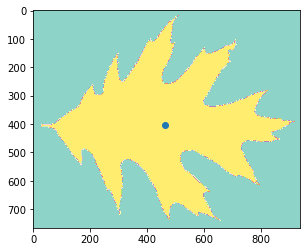

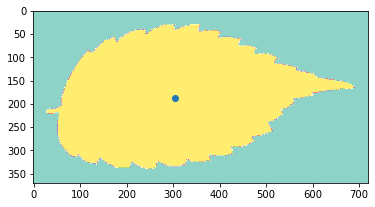

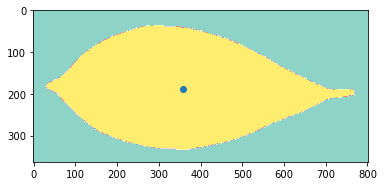

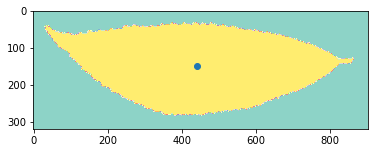

In [65]:
# refence : https://www.kaggle.com/lorinc/feature-extraction-from-images

import matplotlib.image as mpimg
from scipy import ndimage
# reading an image file using matplotlib into a numpy array
img = mpimg.imread('D:/DEBI/Queens/Deep Learning/Project/1/Data/Images/images/53.jpg')

def draw(img):
    
    # using image processing module of scipy to find the center of the leaf
    cy, cx = ndimage.center_of_mass(img)

    plt.imshow(img, cmap='Set3')  # show me the leaf
    plt.scatter(cx, cy)           # show me its center

    plt.show()

for i in range(1, 20,6):
    #drawing 20 images from image 1 to image 96 with neglecting 5 images in between
    img = mpimg.imread('D:/DEBI/Queens/Deep Learning/Project/1/Data/Images/images/1'+str(i)+'.jpg')
    draw(img)

# Cleaning the Data: <a class="anchor" id="cleaning"></a>

the data is already as clean as it gets;

1- no missing values
2- no duplicates

In [67]:
data[data.isna()==True].any(axis = 0).sum() # no null values

0

In [221]:
# checking duplicates
a = train_file.duplicated()
a[a==True] #no duplicate rows

Series([], dtype: bool)

# Feature Analysis: <a class="anchor" id="feature"></a>
draw a histogram of the three features for each class

Acer_Opalus


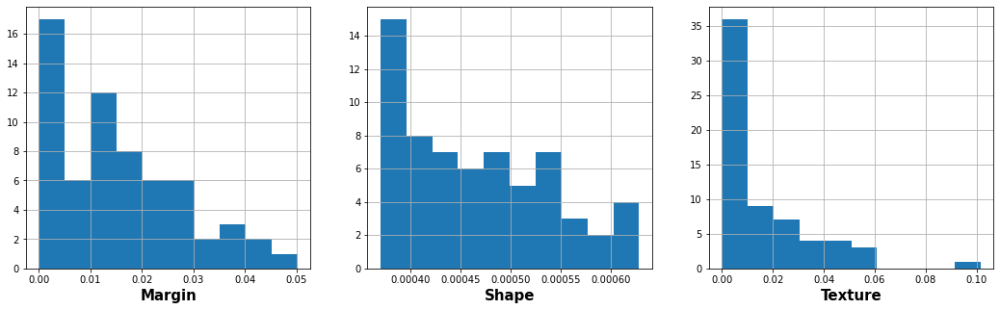

Pterocarya_Stenoptera


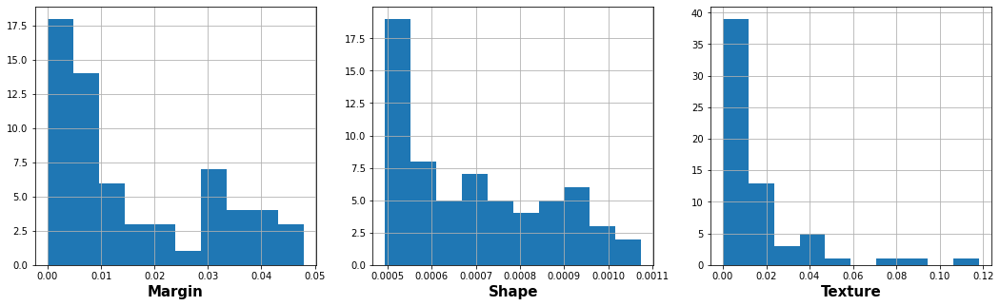

Quercus_Hartwissiana


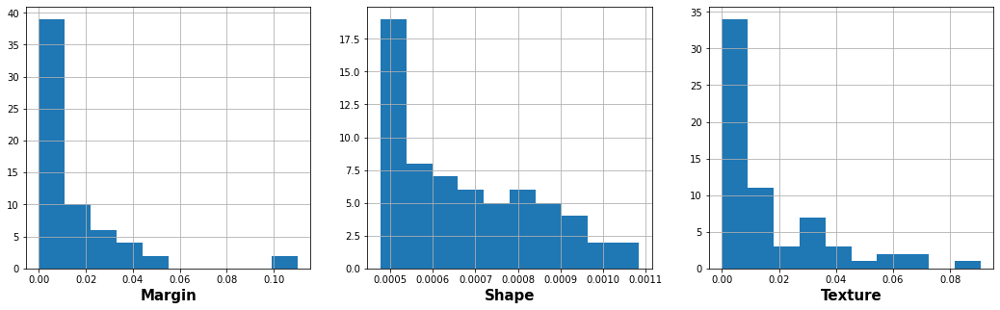

Tilia_Tomentosa


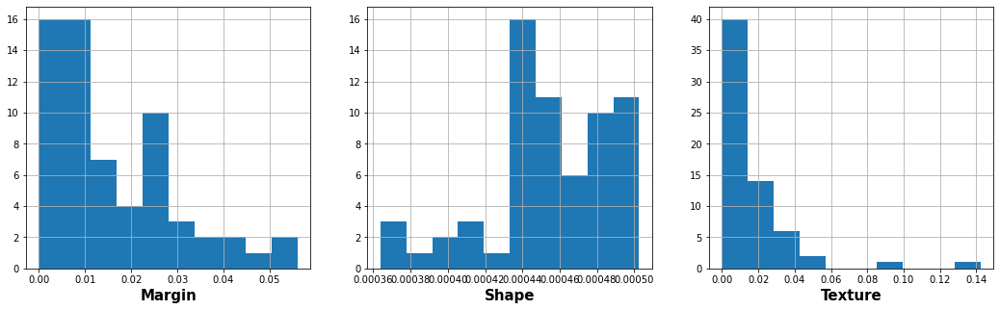

Quercus_Variabilis


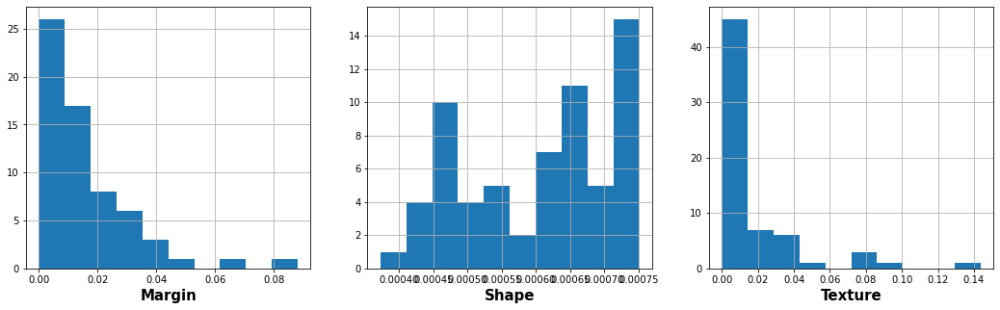

Magnolia_Salicifolia


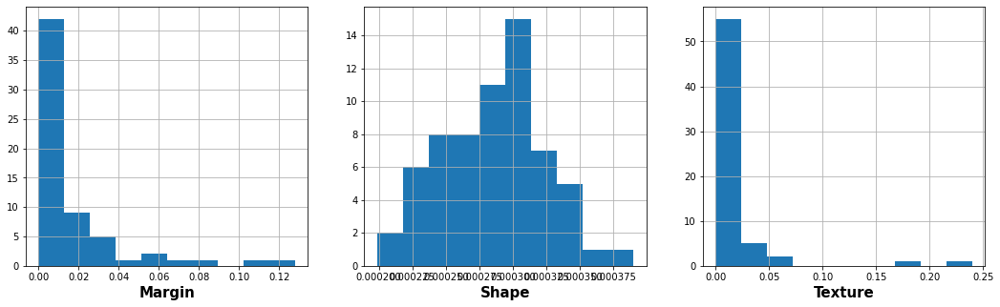

Quercus_Canariensis


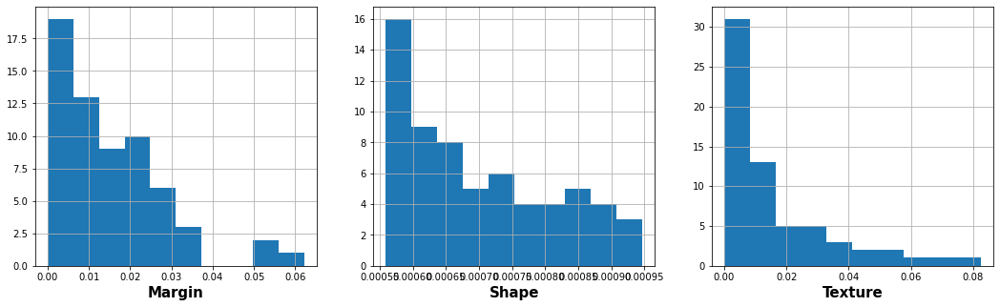

Quercus_Rubra


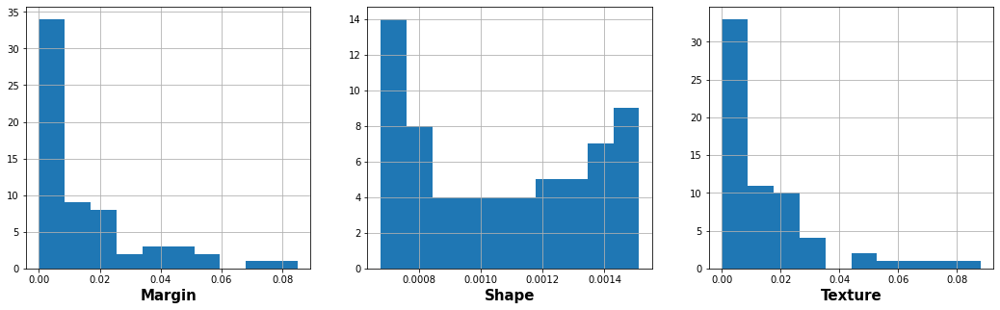

Quercus_Brantii


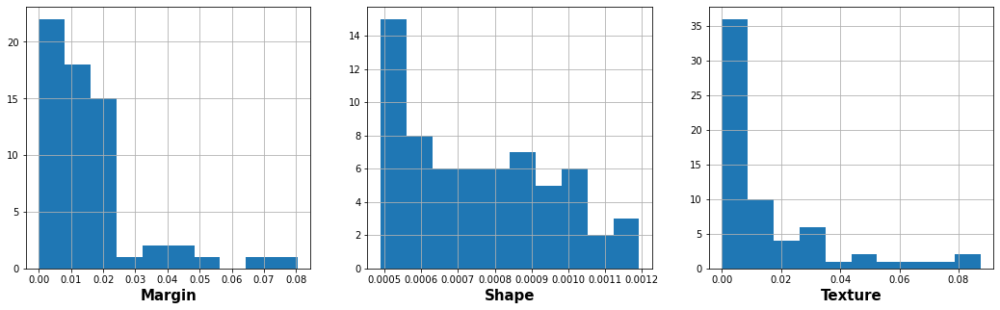

Salix_Fragilis


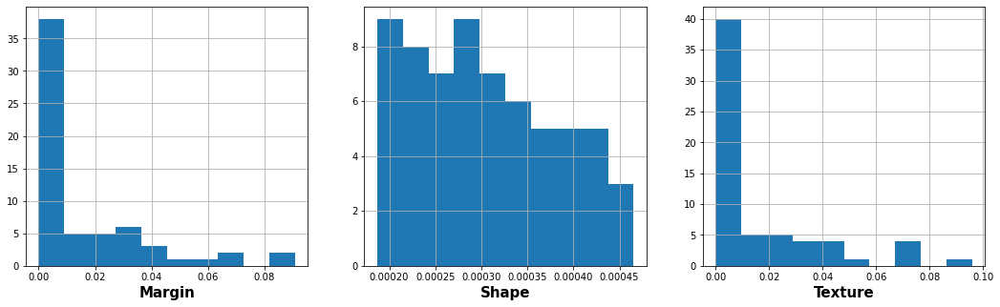

Zelkova_Serrata


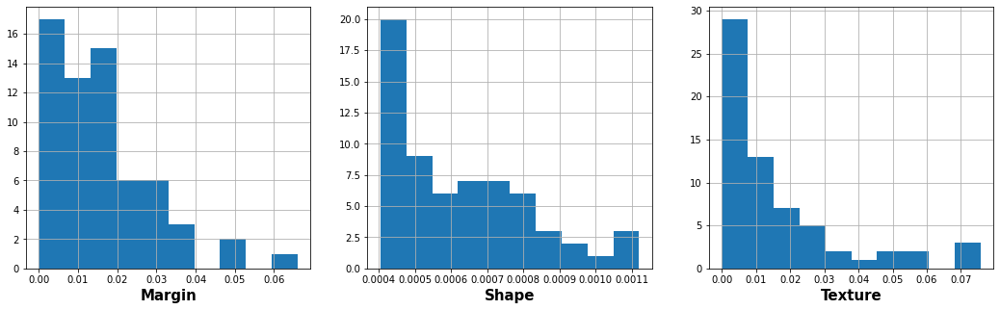

Betula_Austrosinensis


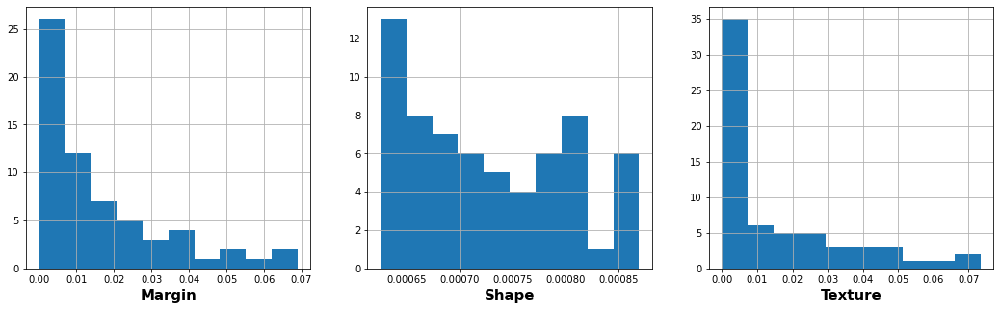

Quercus_Pontica


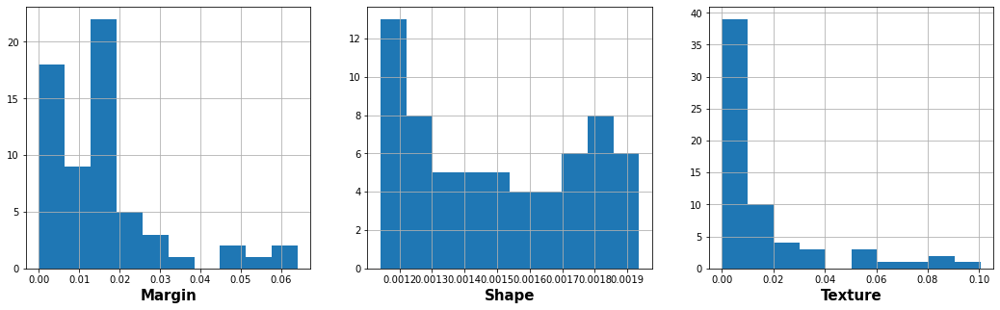

Quercus_Afares


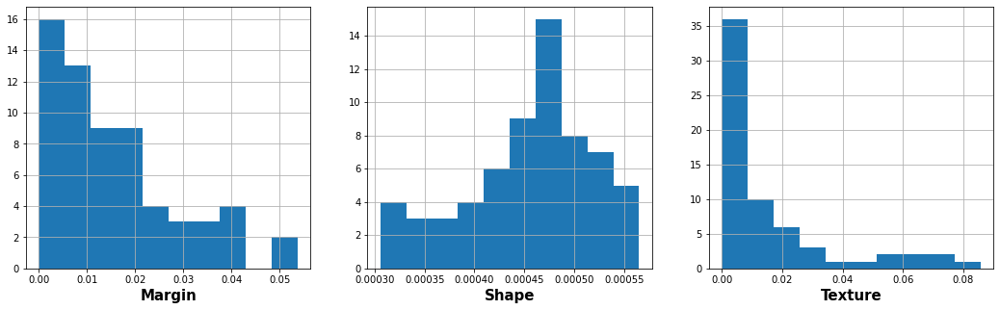

Quercus_Coccifera


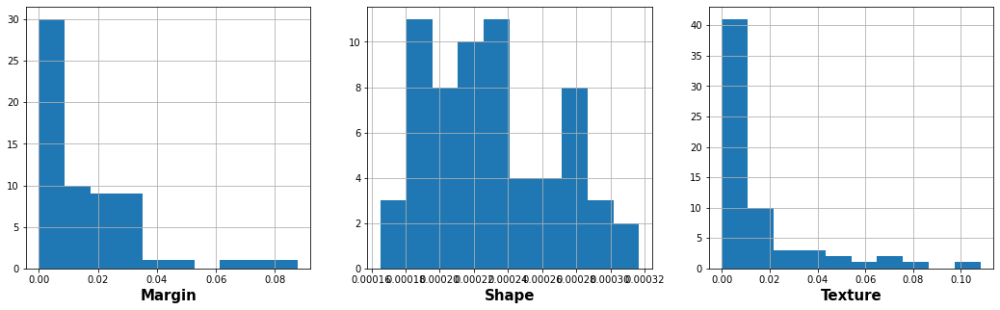

Fagus_Sylvatica


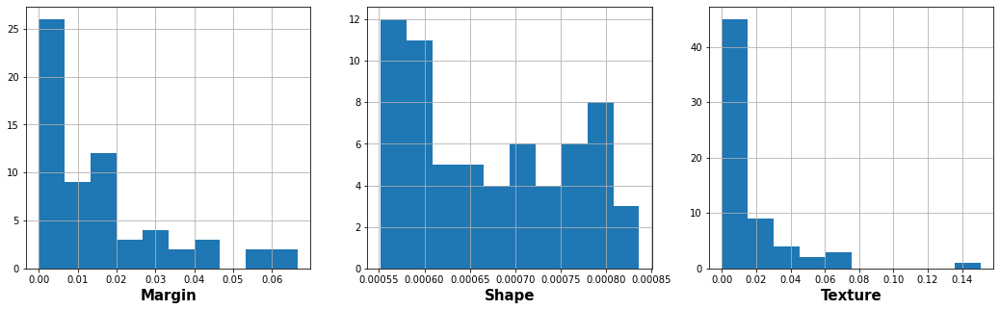

Phildelphus


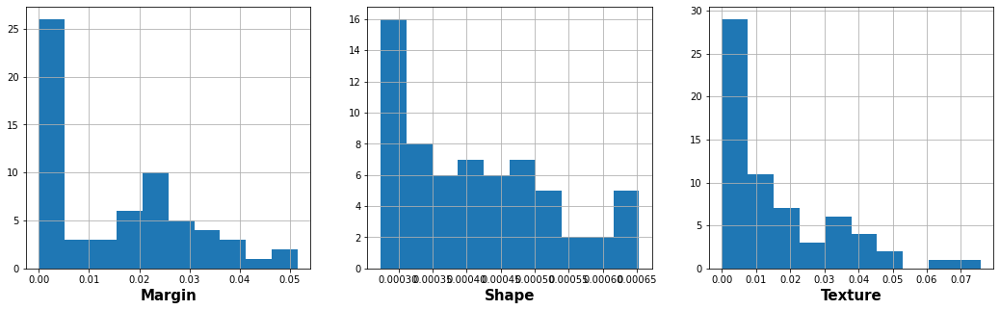

Acer_Palmatum


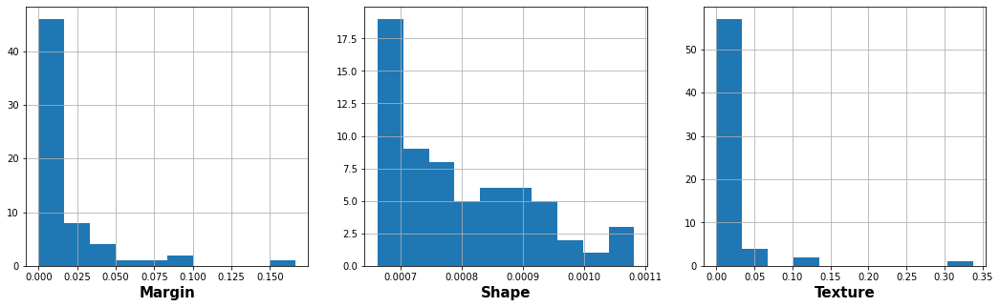

Quercus_Pubescens


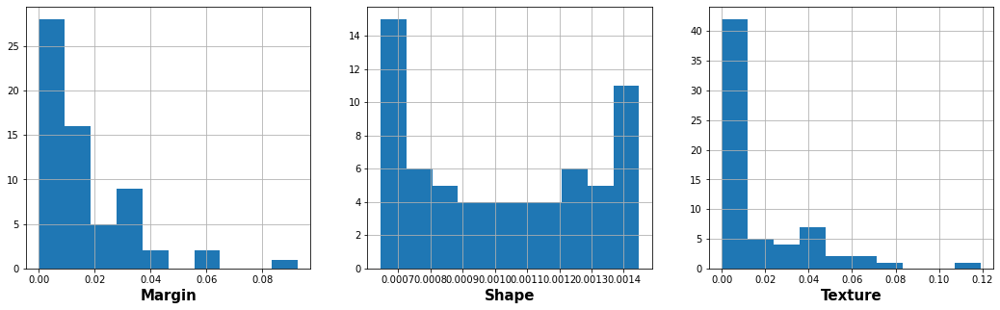

Populus_Adenopoda


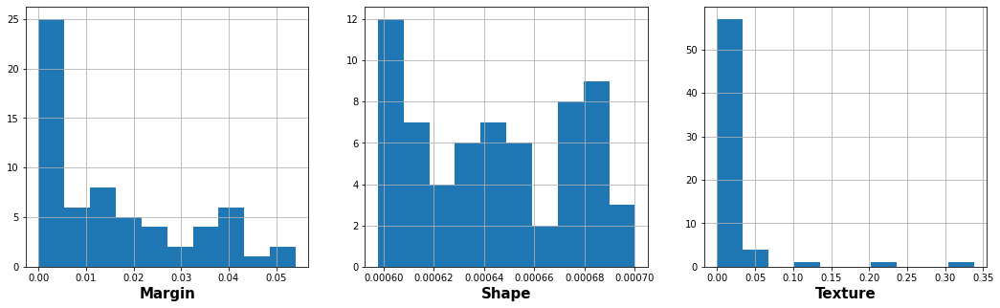

Quercus_Trojana


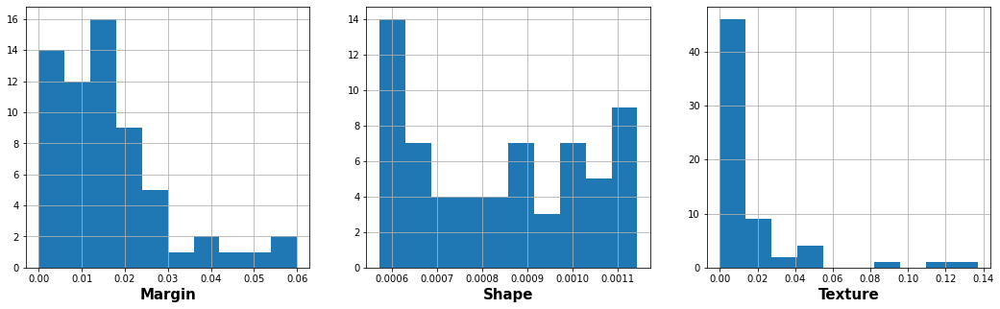

Alnus_Sieboldiana


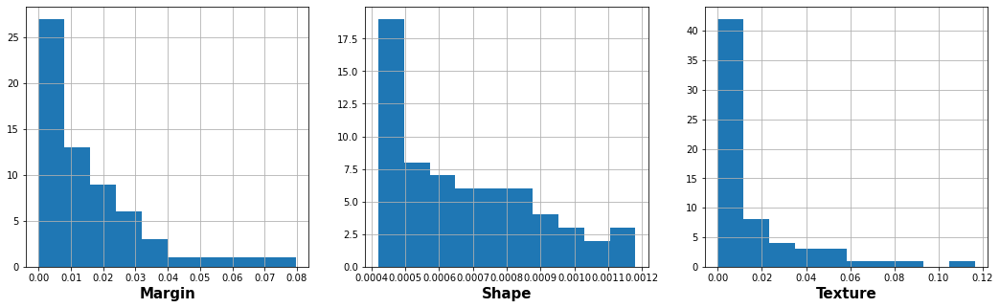

Quercus_Ilex


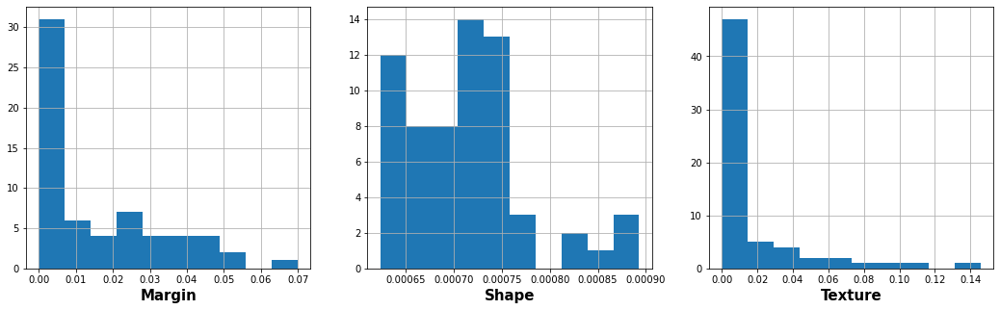

Arundinaria_Simonii


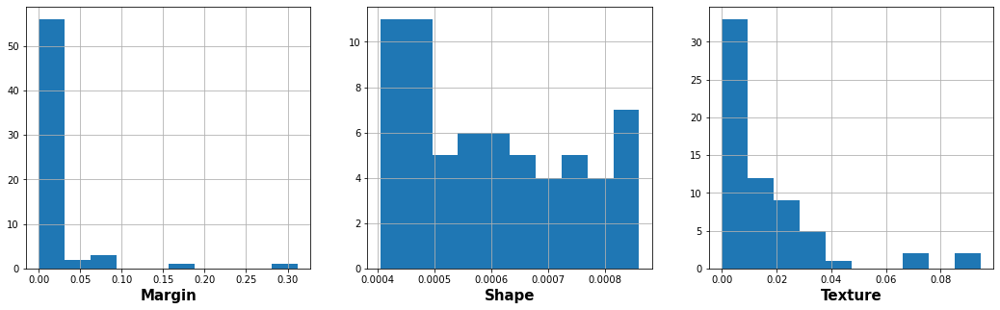

Acer_Platanoids


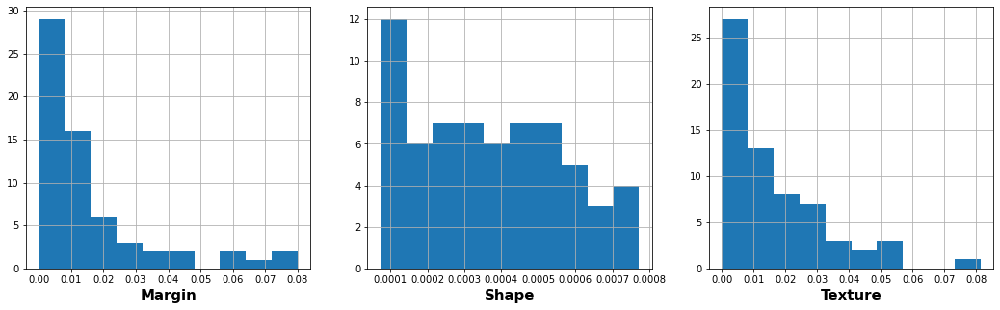

Quercus_Phillyraeoides


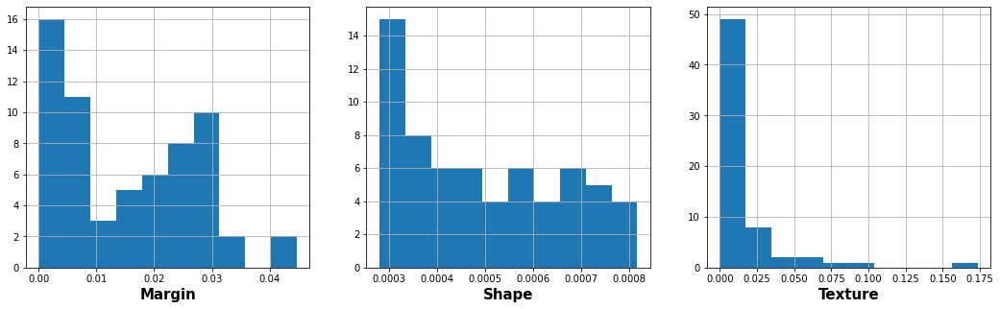

Cornus_Chinensis


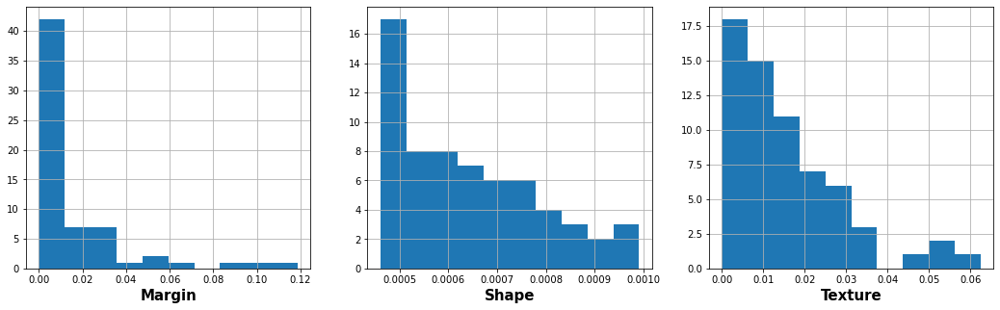

Liriodendron_Tulipifera


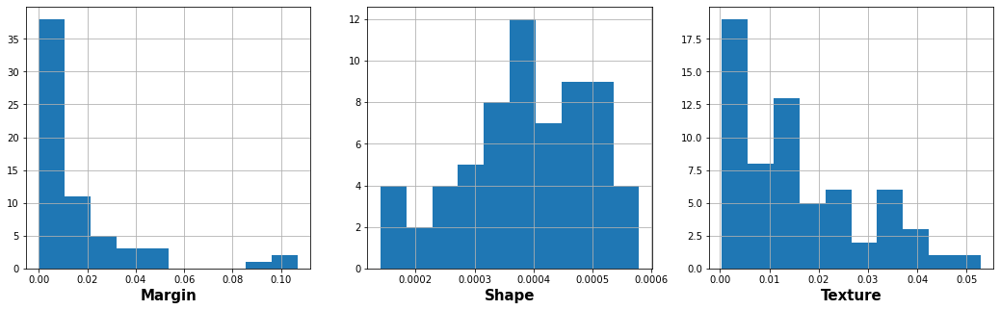

Cytisus_Battandieri


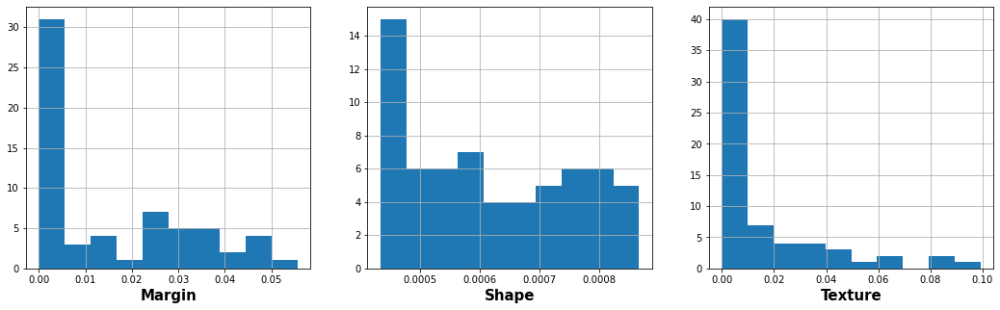

Rhododendron_x_Russellianum


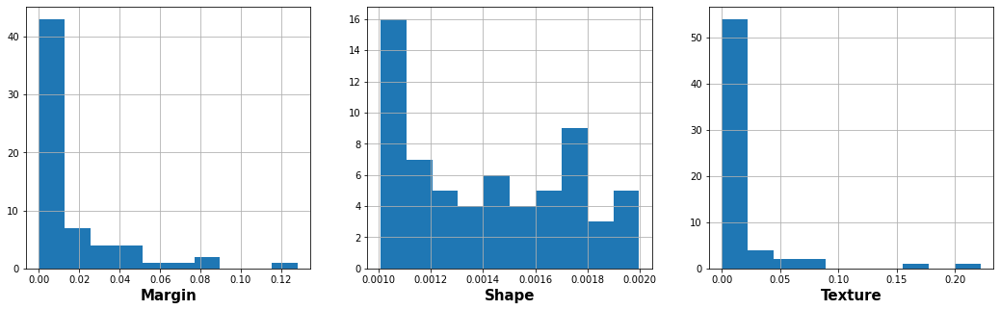

Alnus_Rubra


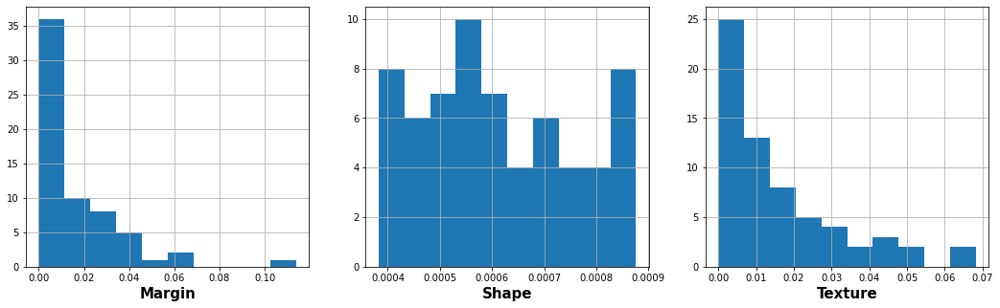

Eucalyptus_Glaucescens


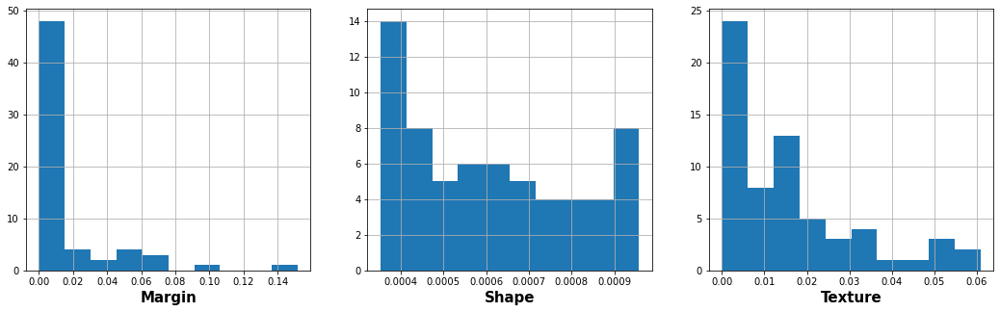

Cercis_Siliquastrum


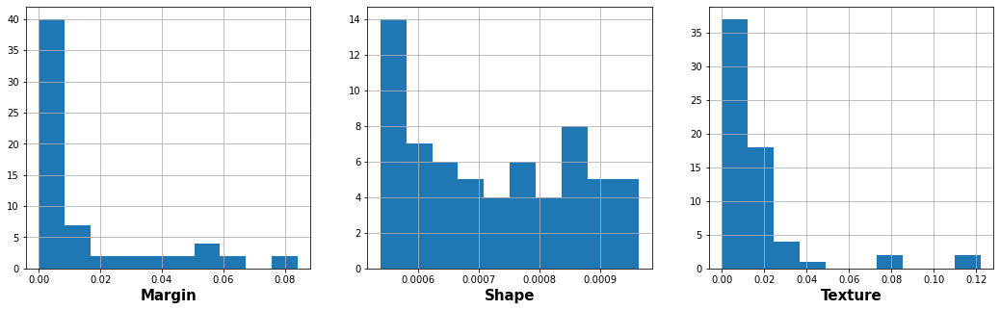

Cotinus_Coggygria


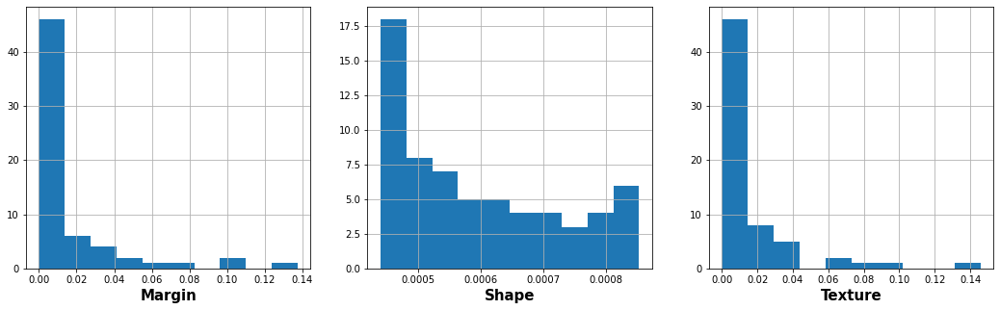

Celtis_Koraiensis


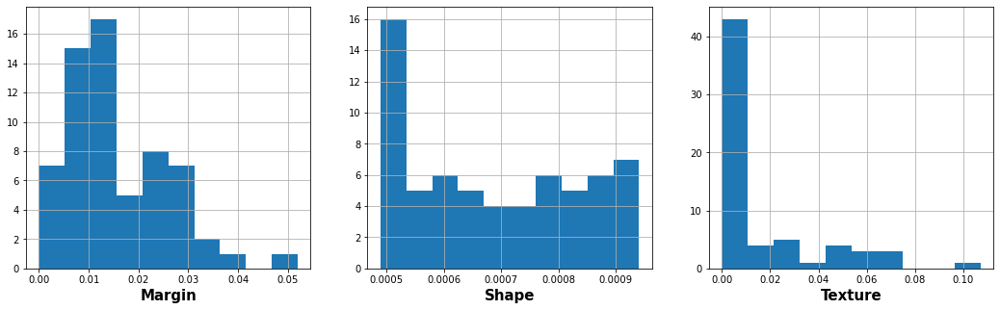

Quercus_Crassifolia


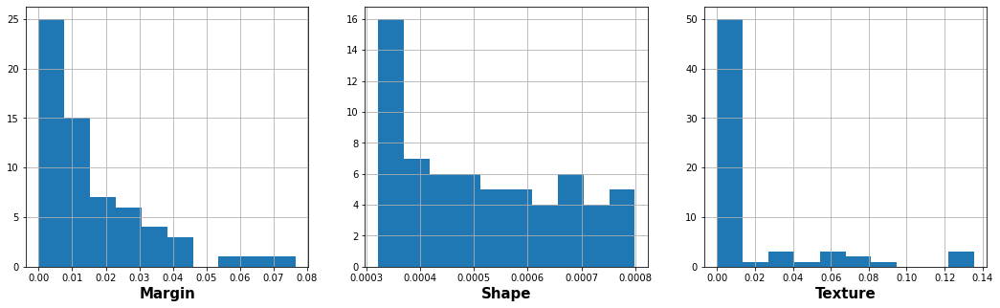

Quercus_Kewensis


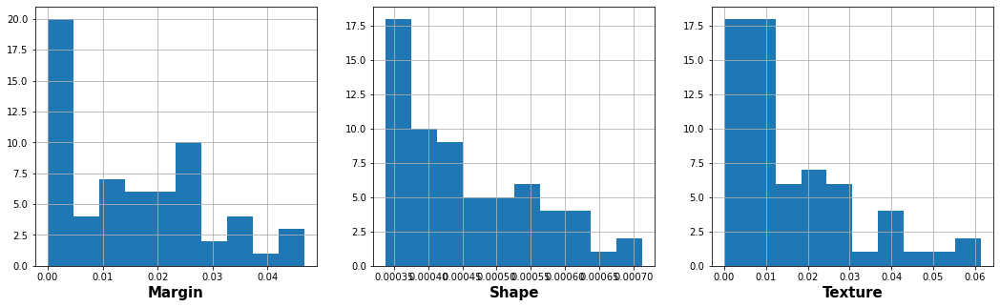

Cornus_Controversa


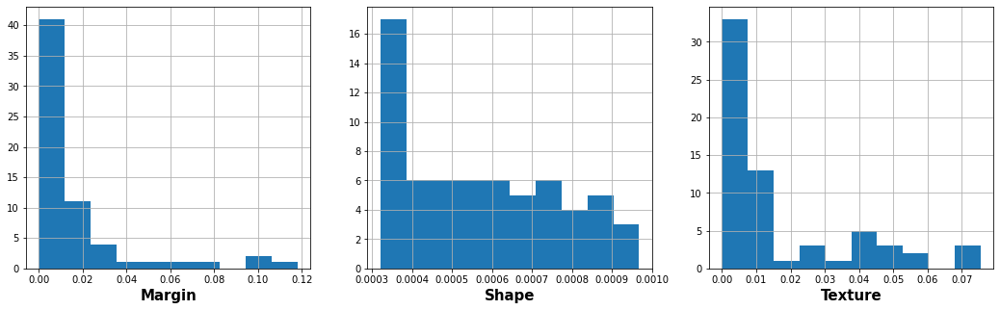

Quercus_Pyrenaica


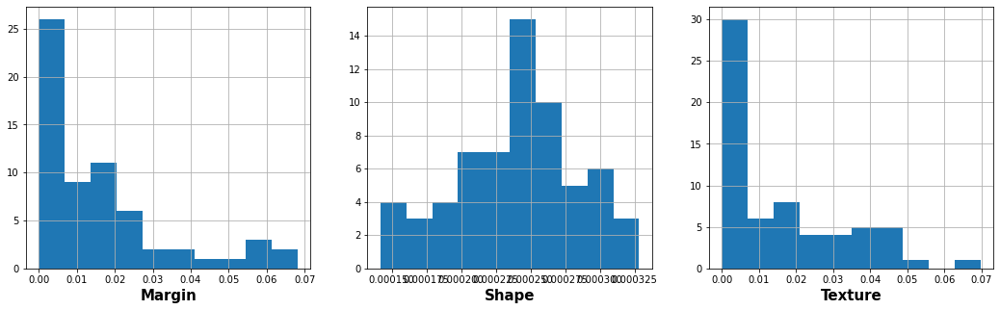

Callicarpa_Bodinieri


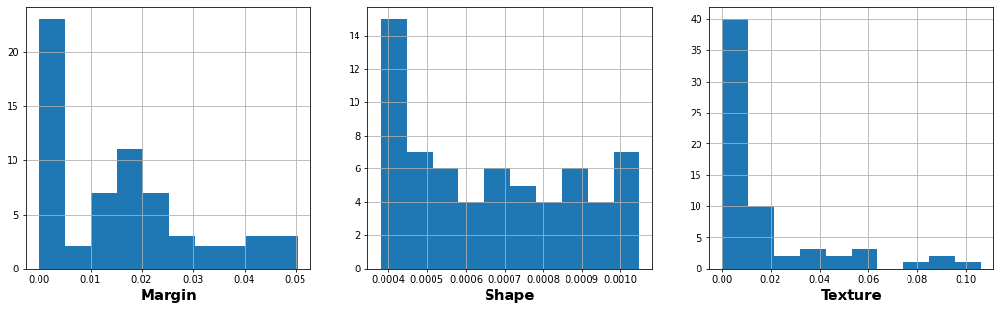

Quercus_Alnifolia


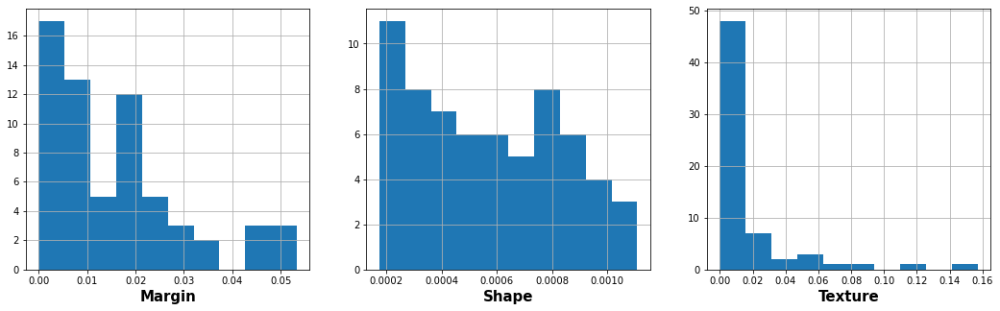

Acer_Saccharinum


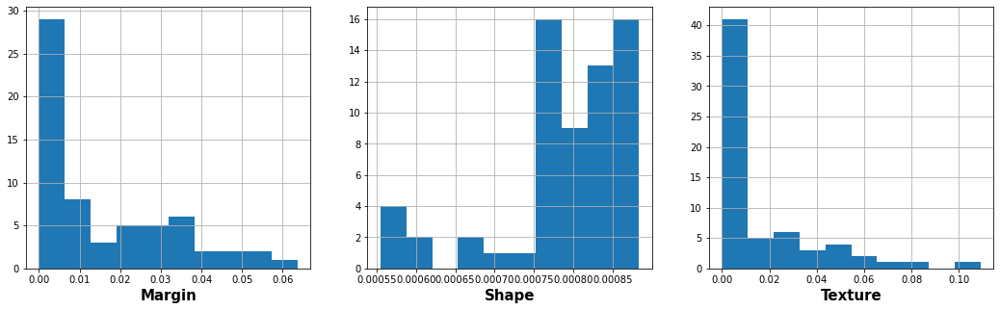

Prunus_X_Shmittii


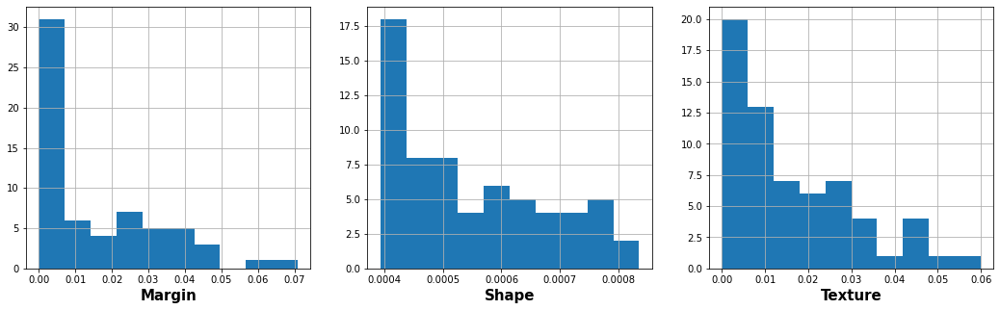

Prunus_Avium


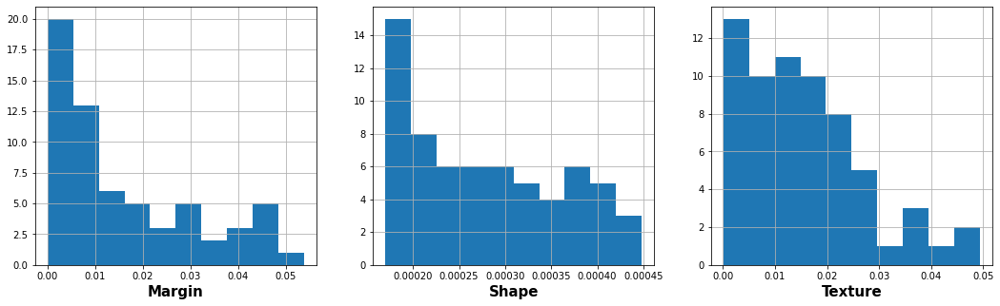

Quercus_Greggii


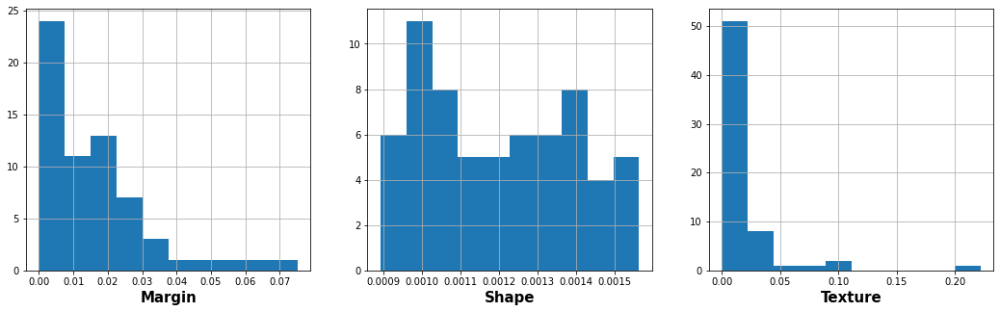

Quercus_Suber


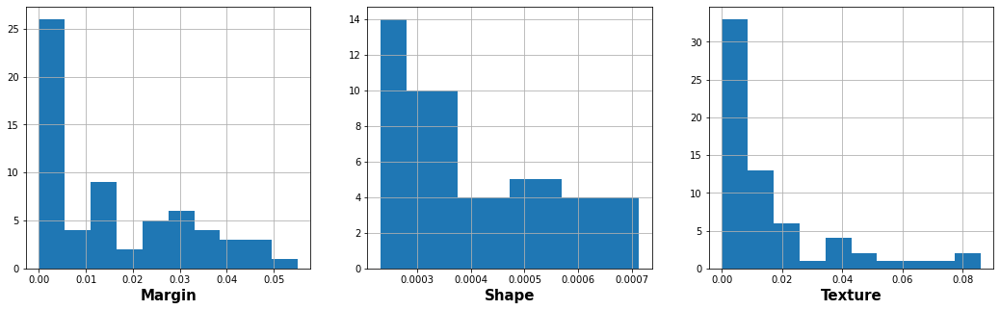

Quercus_Dolicholepis


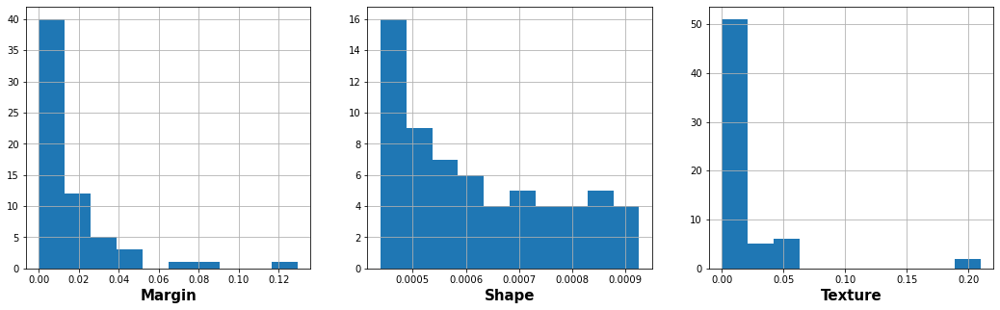

Ilex_Cornuta


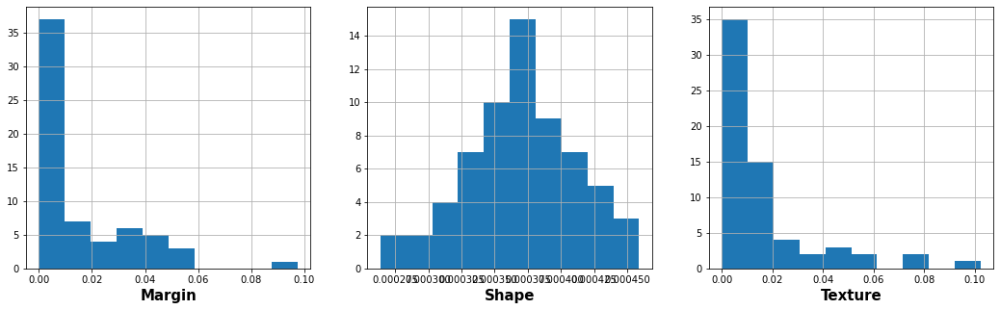

Tilia_Oliveri


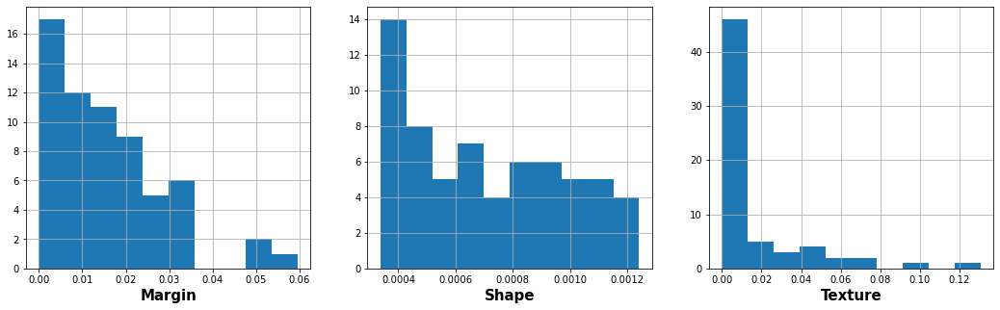

Quercus_Semecarpifolia


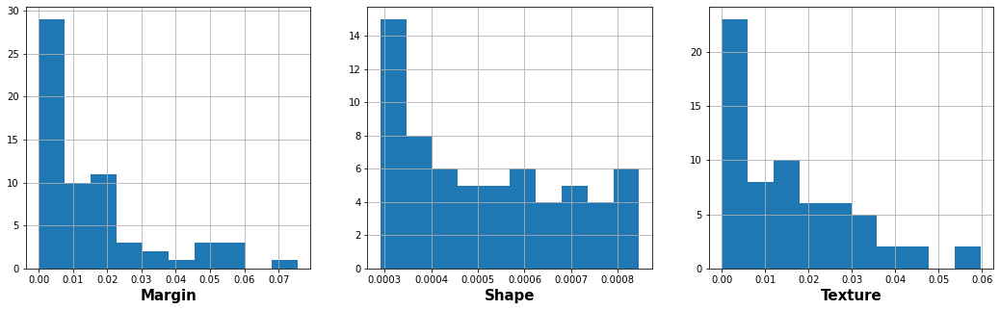

Quercus_Texana


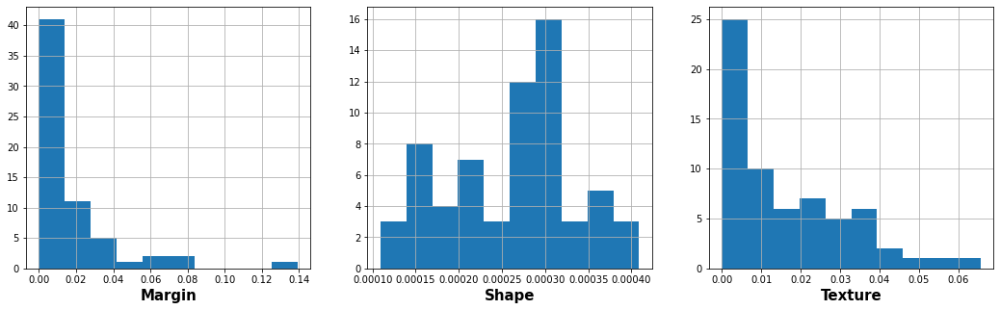

Ginkgo_Biloba


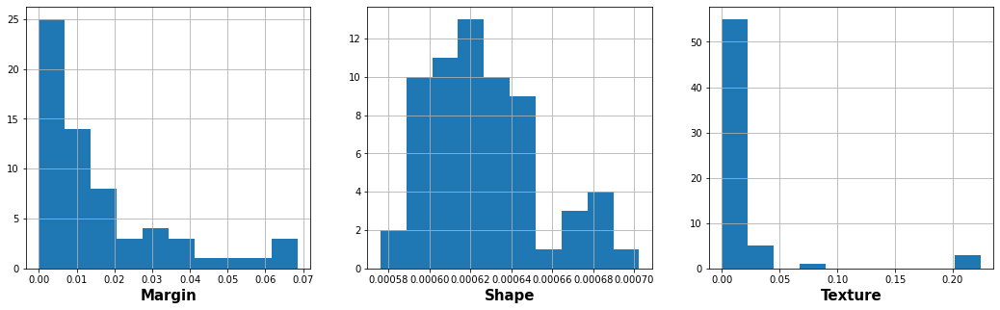

Liquidambar_Styraciflua


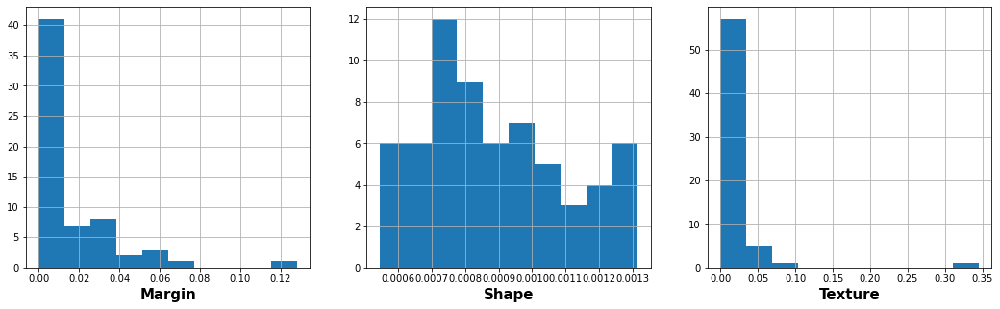

Quercus_Phellos


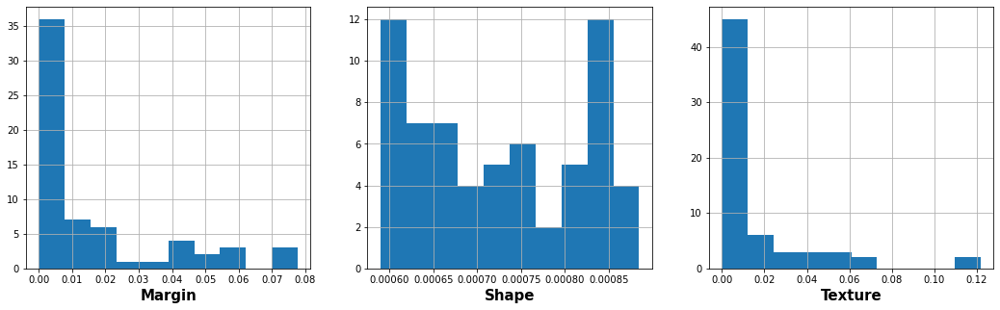

Quercus_Palustris


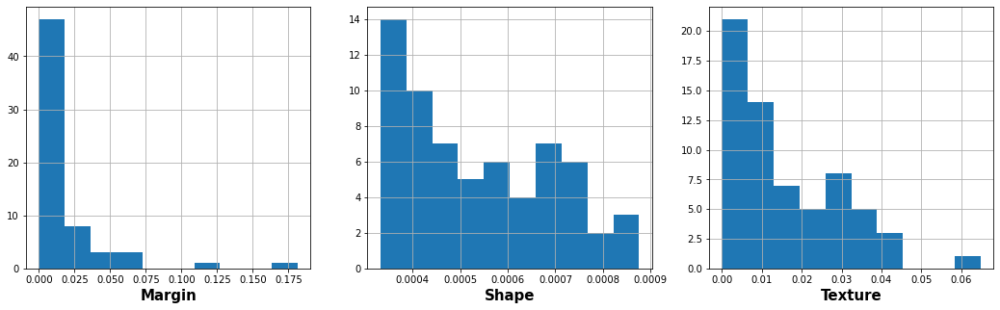

Alnus_Maximowiczii


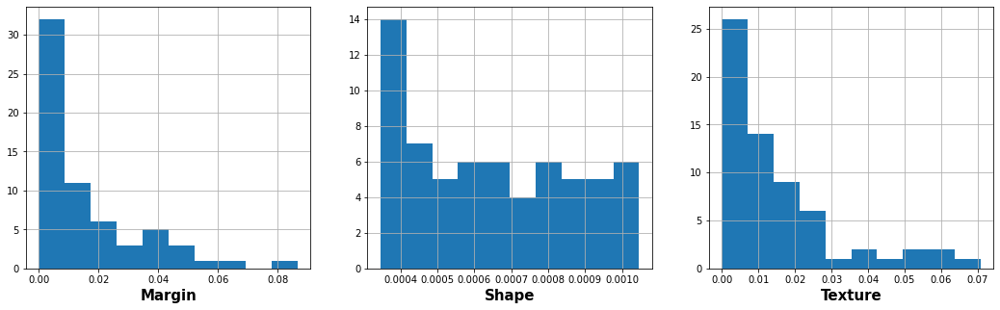

Quercus_Agrifolia


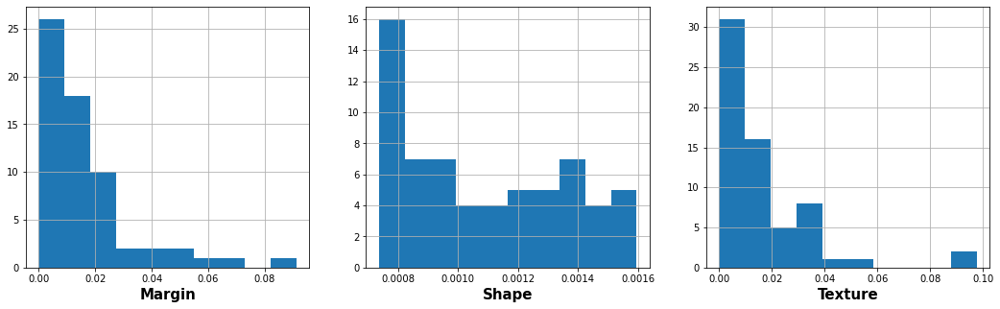

Acer_Pictum


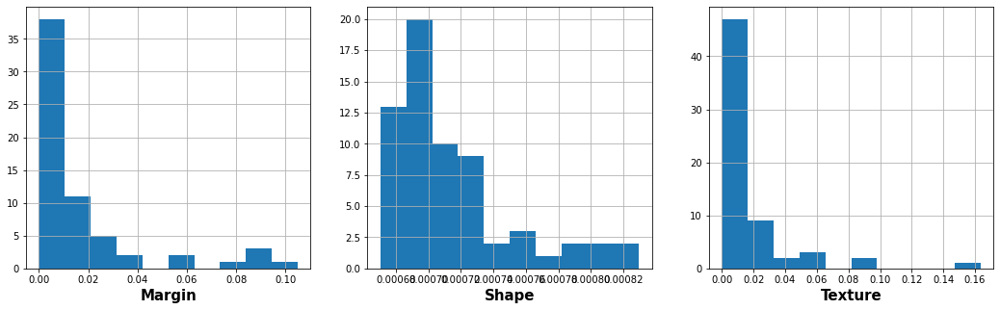

Acer_Rufinerve


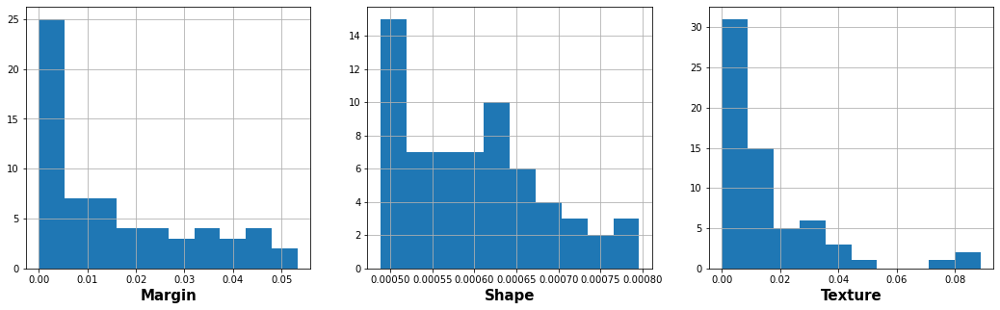

Lithocarpus_Cleistocarpus


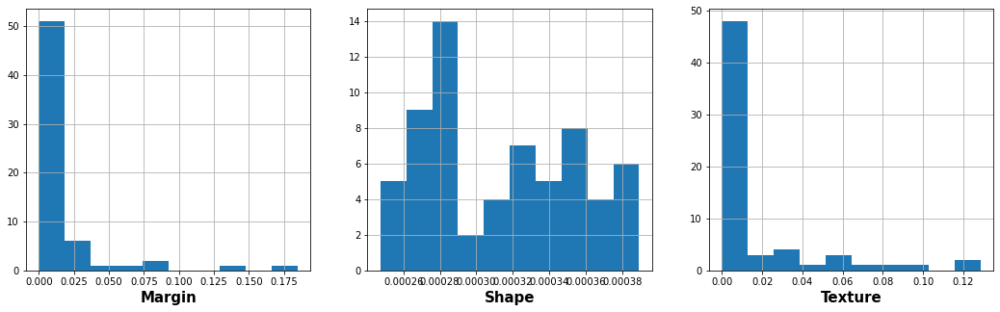

Viburnum_x_Rhytidophylloides


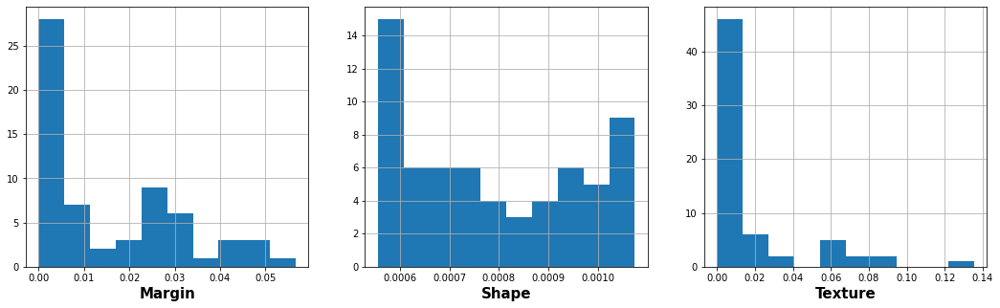

Ilex_Aquifolium


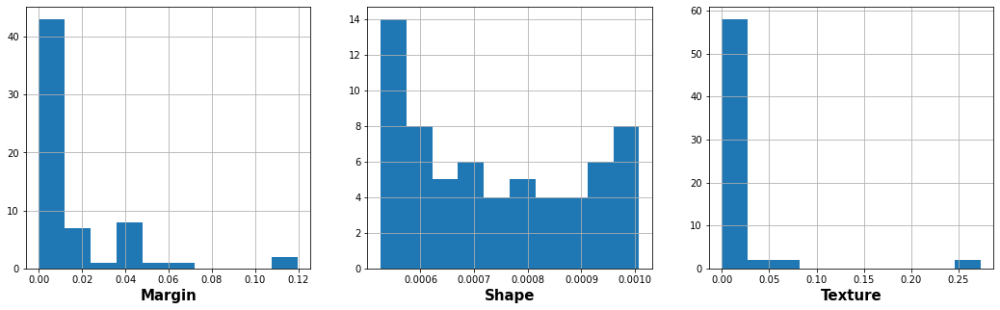

Acer_Circinatum


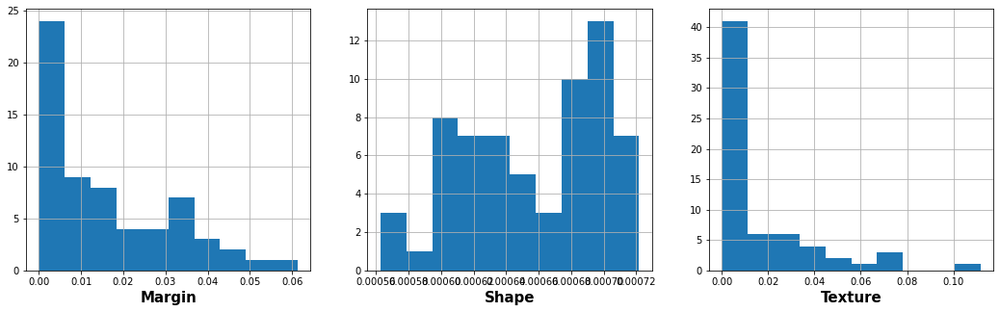

Quercus_Coccinea


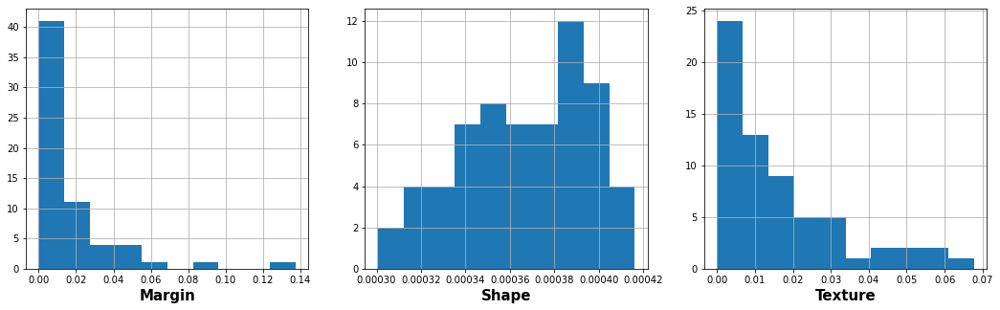

Quercus_Cerris


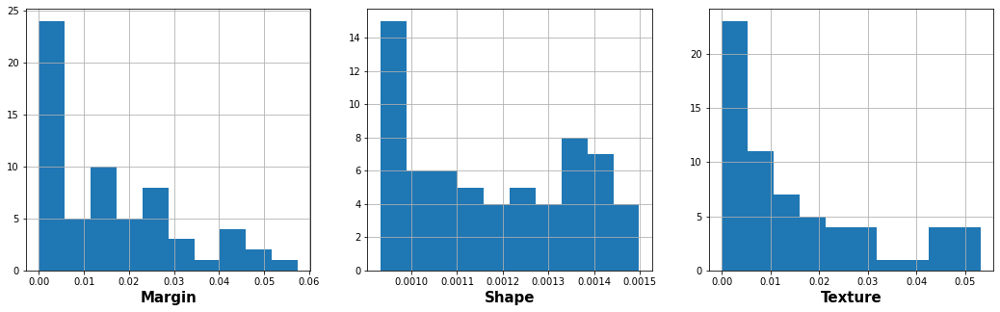

Quercus_Chrysolepis


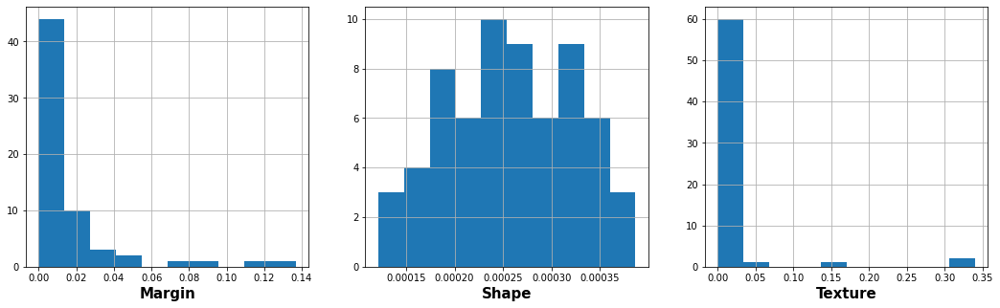

Eucalyptus_Neglecta


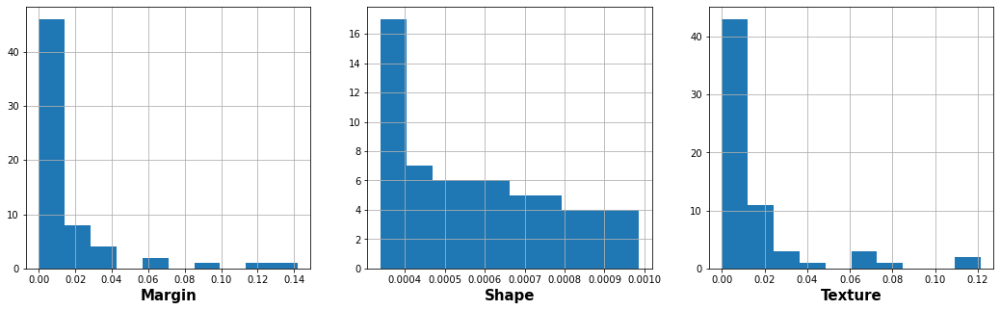

Tilia_Platyphyllos


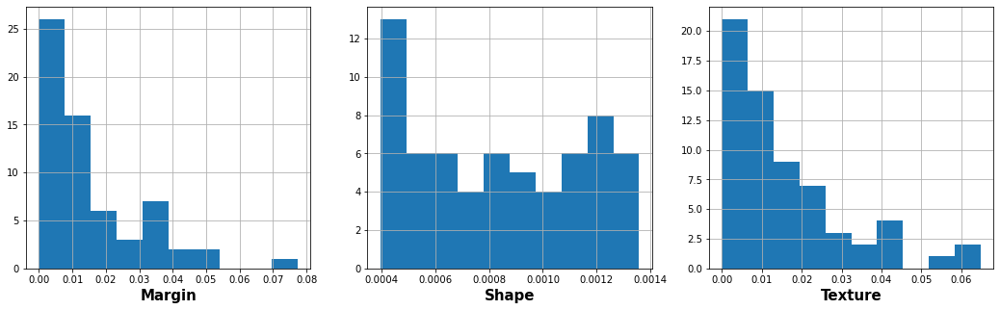

Alnus_Cordata


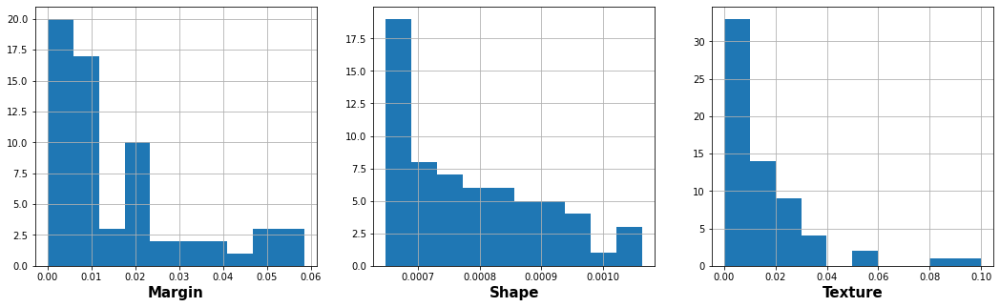

Populus_Nigra


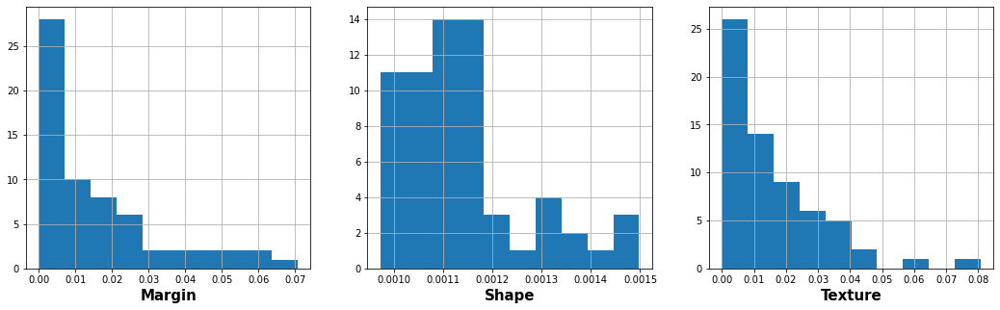

Acer_Capillipes


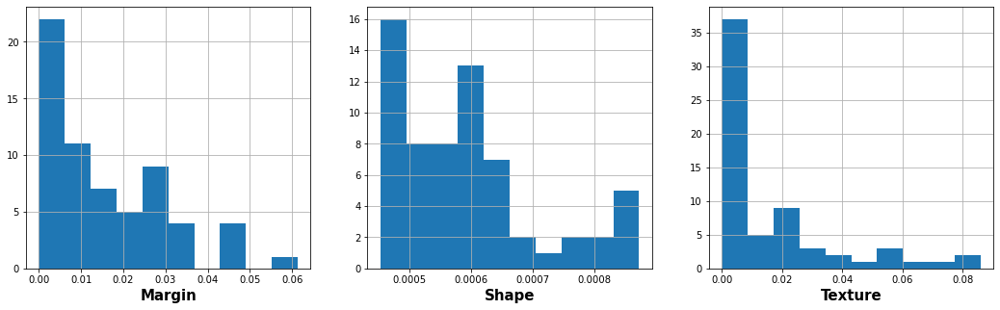

Magnolia_Heptapeta


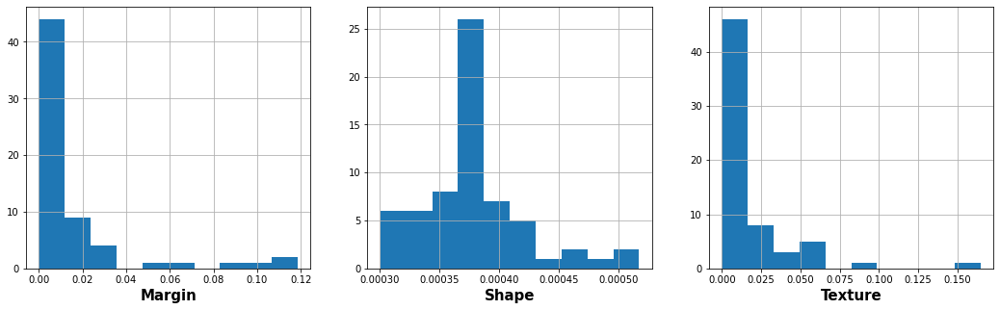

Acer_Mono


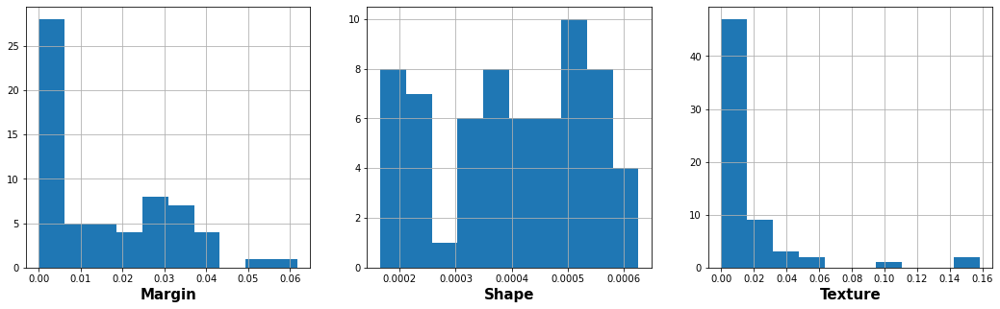

Cornus_Macrophylla


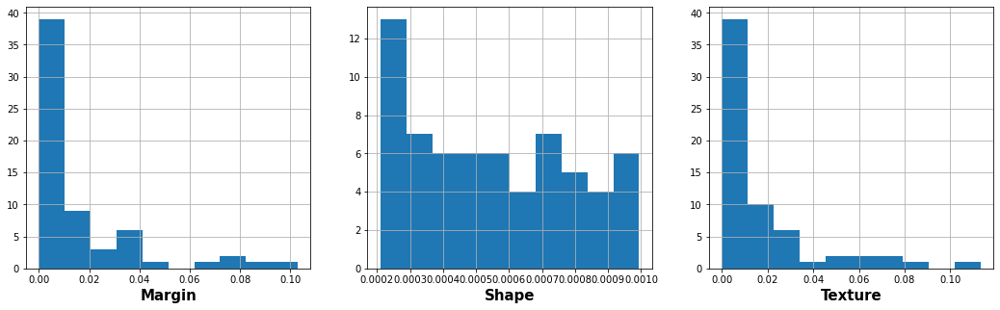

Crataegus_Monogyna


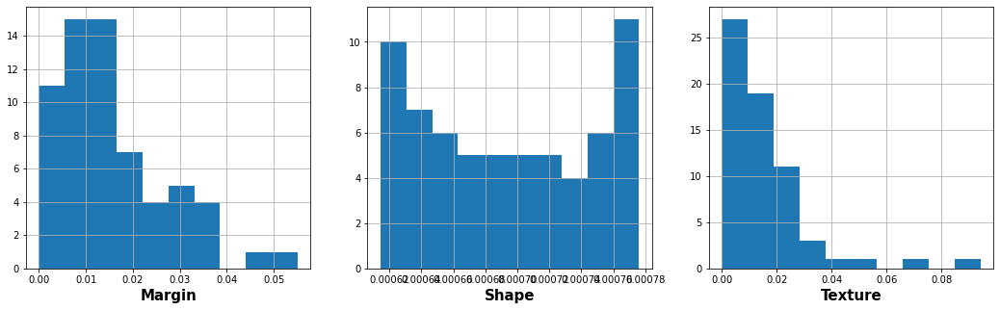

Quercus_x_Turneri


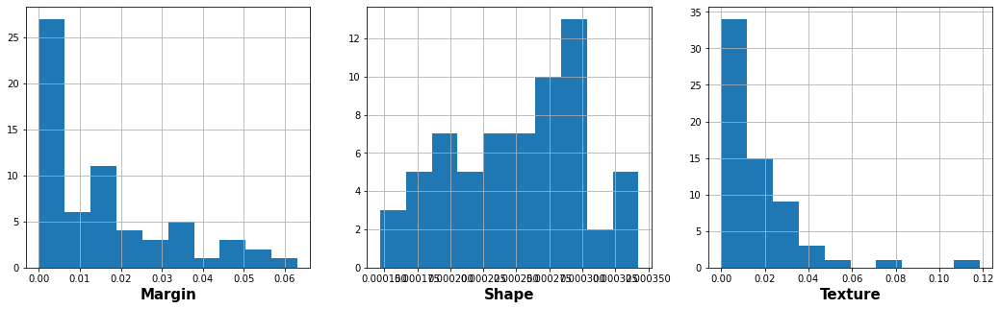

Quercus_Castaneifolia


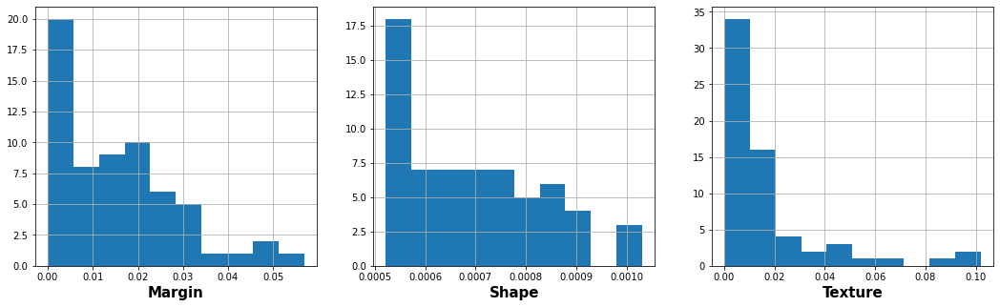

Lithocarpus_Edulis


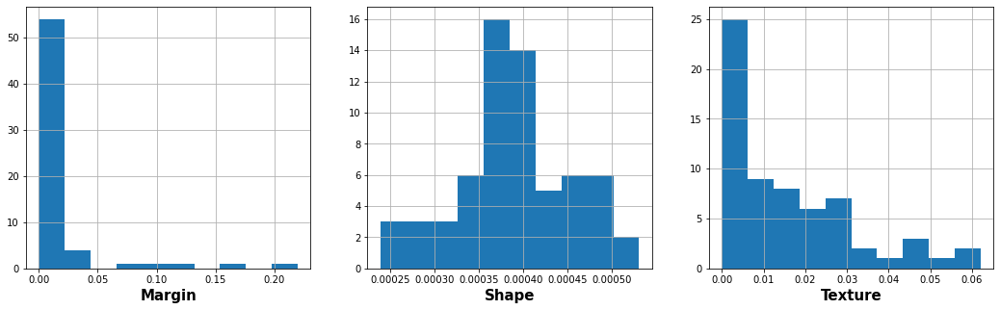

Populus_Grandidentata


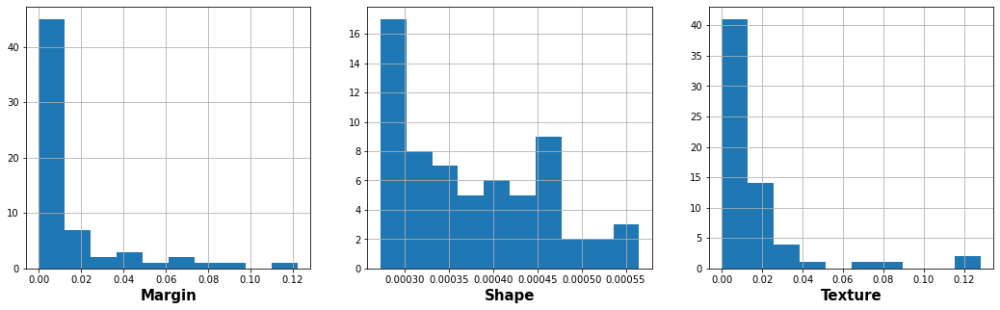

Acer_Rubrum


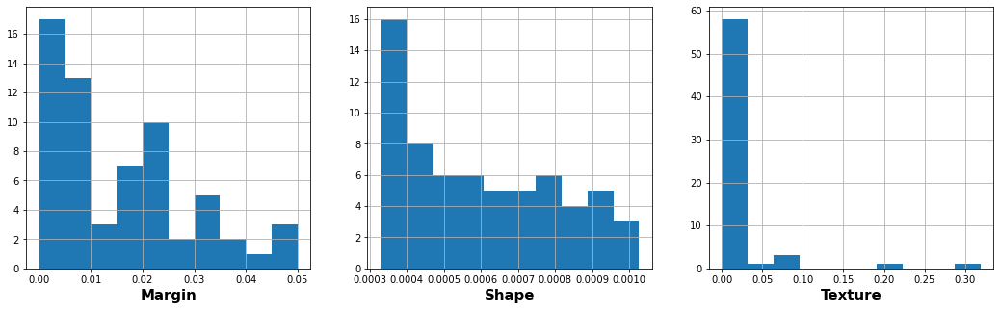

Quercus_Imbricaria


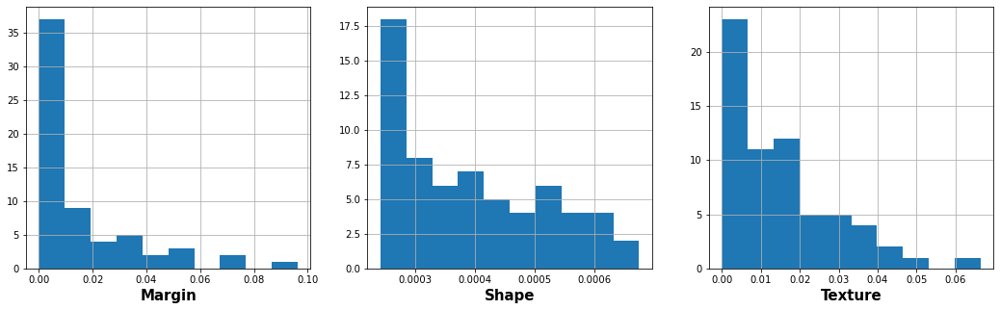

Eucalyptus_Urnigera


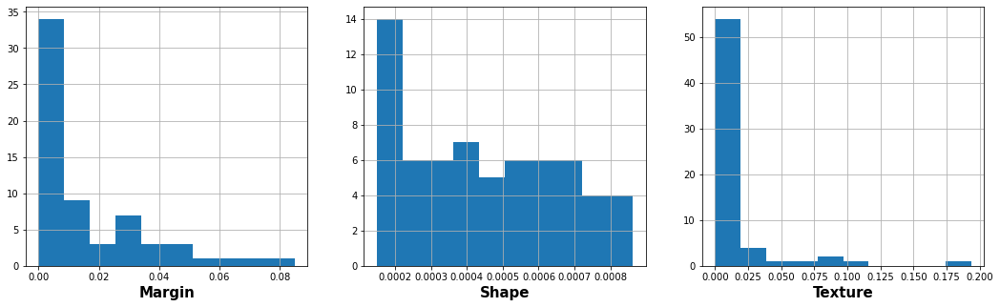

Quercus_Crassipes


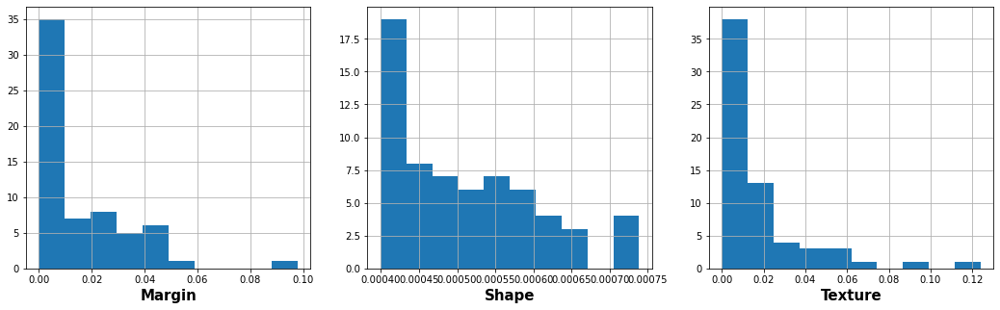

Viburnum_Tinus


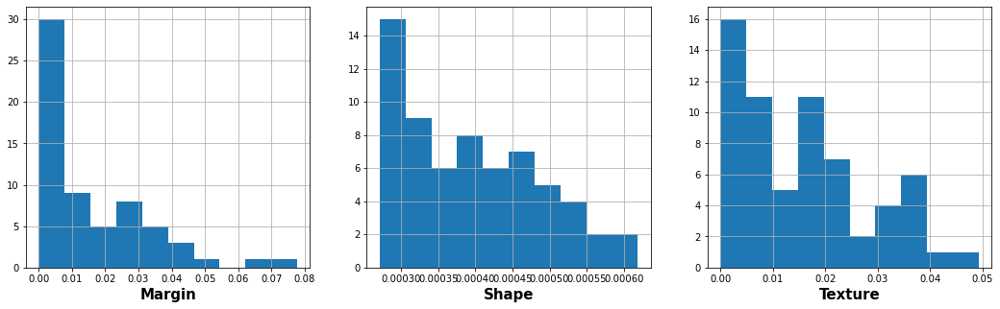

Morus_Nigra


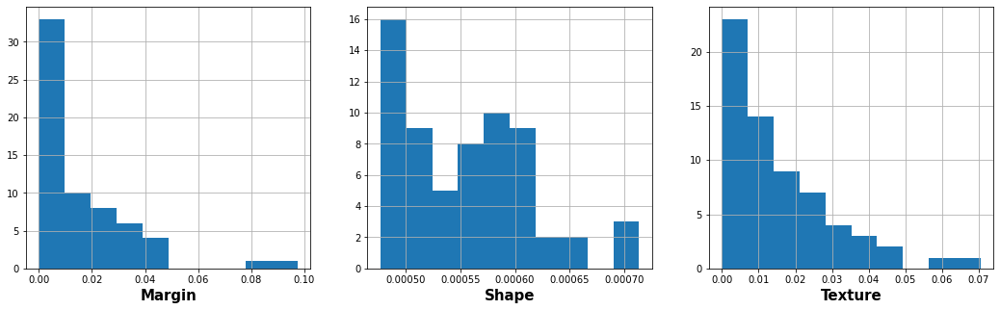

Quercus_Vulcanica


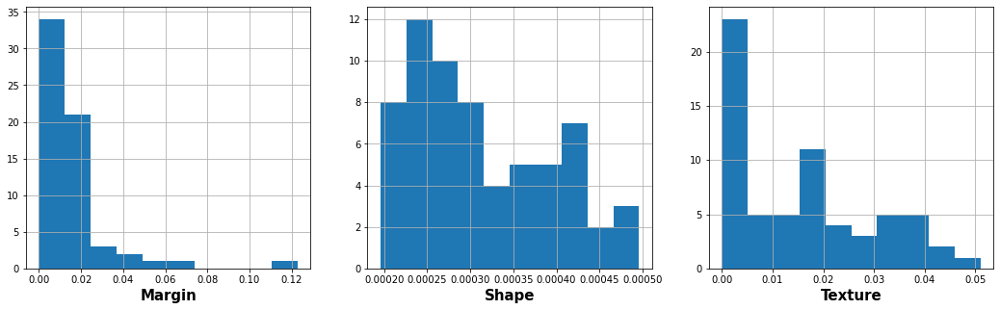

Alnus_Viridis


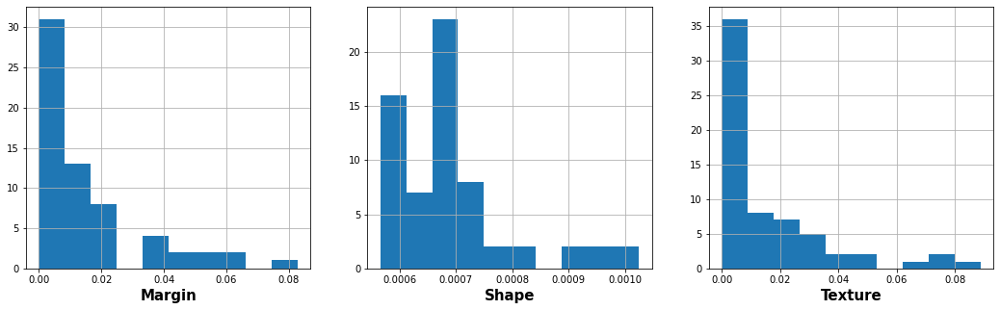

Betula_Pendula


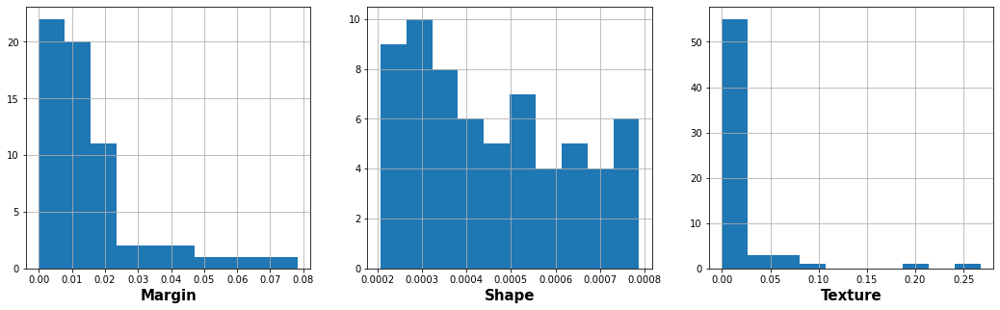

Olea_Europaea


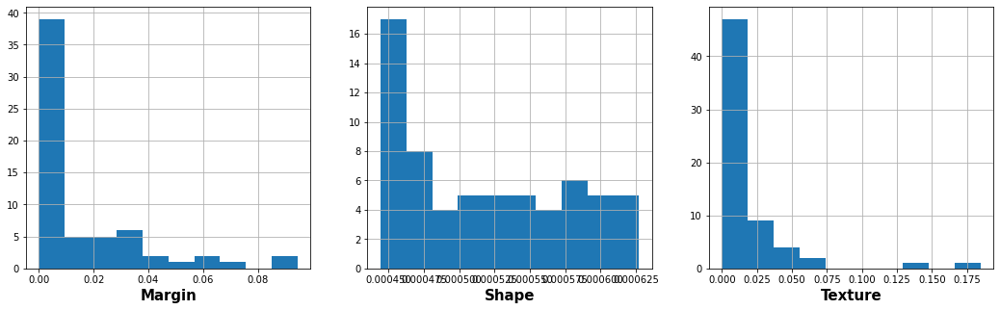

Quercus_Ellipsoidalis


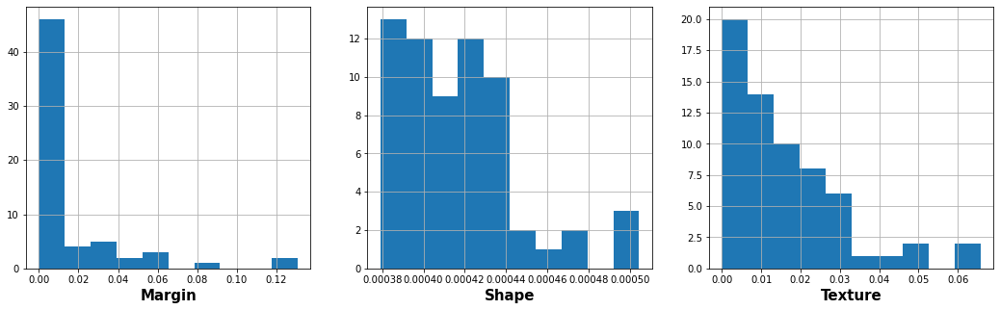

Quercus_x_Hispanica


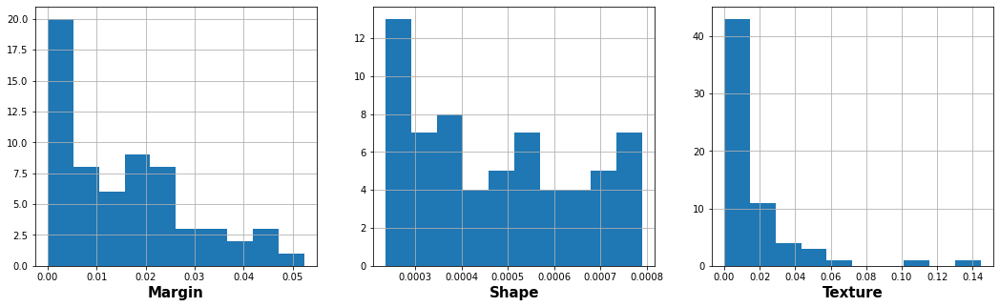

Quercus_Shumardii


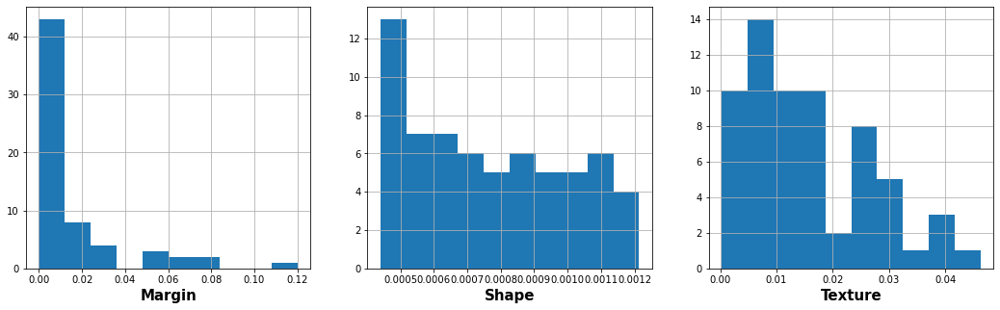

Quercus_Rhysophylla


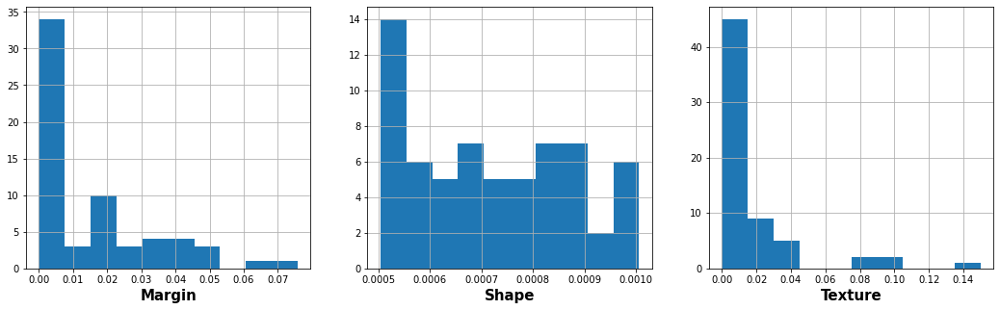

Castanea_Sativa


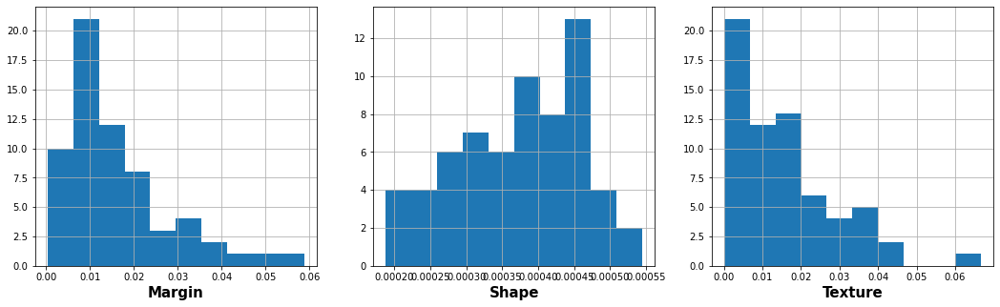

Ulmus_Bergmanniana


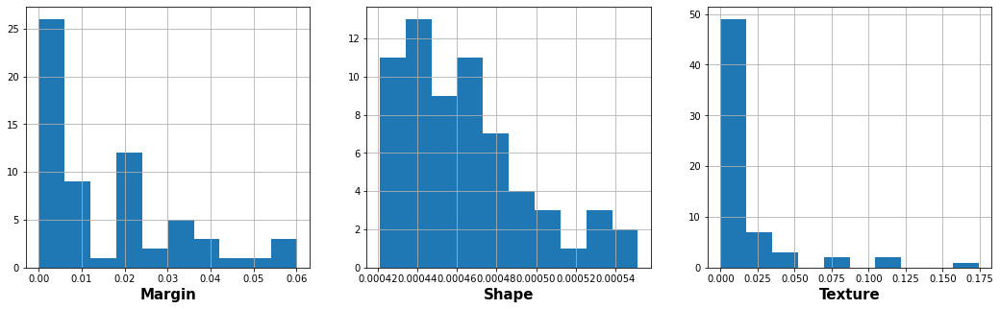

Quercus_Nigra


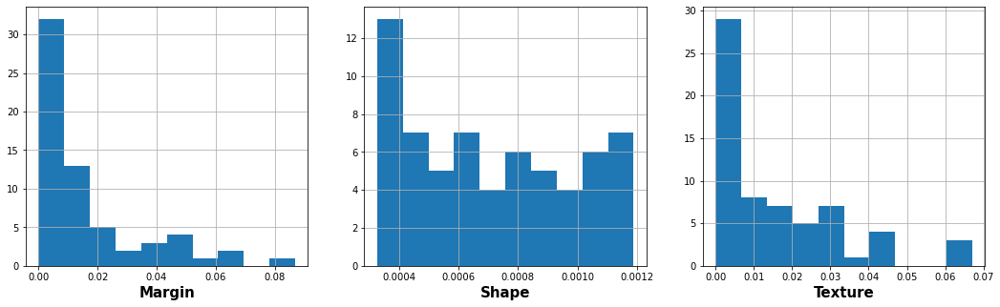

Salix_Intergra


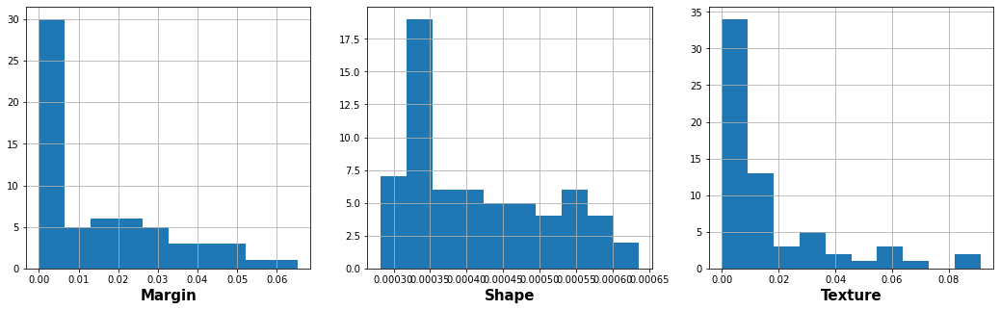

Quercus_Infectoria_sub


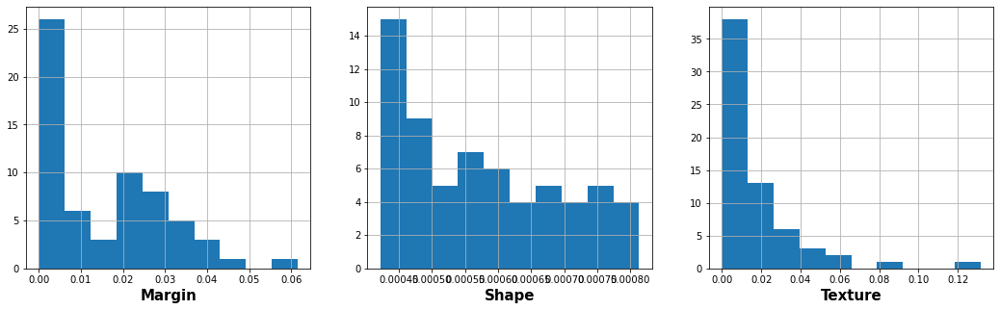

Sorbus_Aria


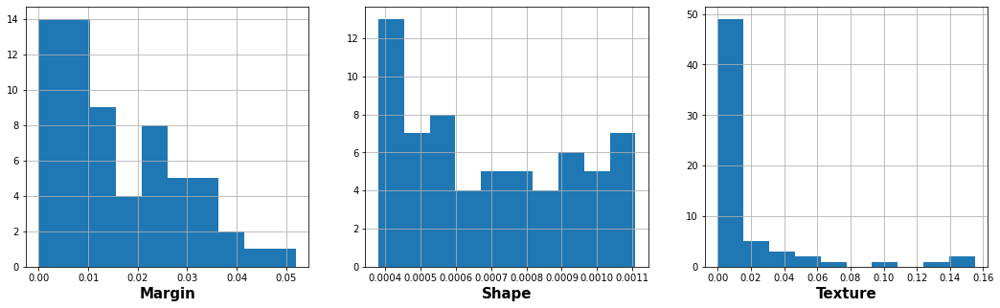

In [211]:
species = pd.unique(df['species'])

for i in species:
    dfi = df[df['species']==i]
    dfi = dfi.drop(['species'],axis=1)
    dfi1 = dfi.iloc[:,2:65]
    dfi2 = dfi.iloc[:,65:129]
    dfi3 = dfi.iloc[:,129:193]
    margin_mean = dfi1.mean(axis=0)
    shape_mean = dfi2.mean(axis=0)
    texture_mean = dfi3.mean(axis=0)
    
    print(i)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))
    ax[0].hist(margin_mean)
    ax[0].set_xlabel('Margin', fontweight ='bold',fontsize=15)
    ax[0].grid()
    ax[1].hist(shape_mean)
    ax[1].set_xlabel('Shape', fontweight ='bold',fontsize=15)
    ax[1].grid()
    ax[2].hist(texture_mean) 
    ax[2].set_xlabel('Texture', fontweight ='bold',fontsize=15)
    ax[2].grid()    
    plt.show()

# Correlation Analysis <a class="anchor" id="corr"></a>
see how the correlation is in the features

In [214]:
import plotly.express as px
fig = px.imshow(df.corr())
fig.show() 

# Problem visualization <a class="anchor" id="problem_visualization"></a>
we will try to visualize the problem by representing each class by its centroid point in a 3D-space of the 3-features -the point representing each class is its center point-.

**Process**: we will compress the data and represent each class with only the mean data point of its 10 samples, thus we will have 99 data points for 99-classes.

**problem**: we need a way to fit the 64 bits of each feature into one column

**possible solution:** get the mean of all 64 bits togetherto form one feature column

In [215]:
def viusal_helper(df):
    # getting the mean margin, shape, and texture for each data point for visualizations
    short_hand_df = []
    for x in range(0,10):

        #margin, shape, and texture values for each data point
        margins = df.iloc[[x],np.arange(2,65)]
        shapes = df.iloc[[x],np.arange(65,129)]
        textures = df.iloc[[x],np.arange(129,193)]

        #getting the means 
        short_hand_df.append([np.mean(margins.values),
                               np.mean(shapes.values),np.mean(textures.values)])

    return np.asarray(short_hand_df)

In [216]:
train_file = pd.read_csv('train.csv', header = 0)
df = train_file.copy()

In [217]:
df_Acer_Opalus = df[df.species == "Acer_Opalus"]
short_hand_np = viusal_helper(df_Acer_Opalus)
print(short_hand_np.shape)

# for each class we have its 10 data points represented by three featuers each
species = df.species.unique()
species_threes = []
for x in species:
    #for every species "class"
    df_x = df[df.species == x]
    #averging each 65 feature into 1 feature
    species_threes.append(viusal_helper(df_x))
    
    

print(np.asarray(species_threes).shape)
species_threes_np = np.asarray(species_threes)

(10, 3)
(99, 10, 3)


In [218]:
# averging the 10 data points of each class into one datapoint
species_threes_np_mean = np.mean(species_threes_np,axis = 1)

species_threes_np_mean.shape

(99, 3)

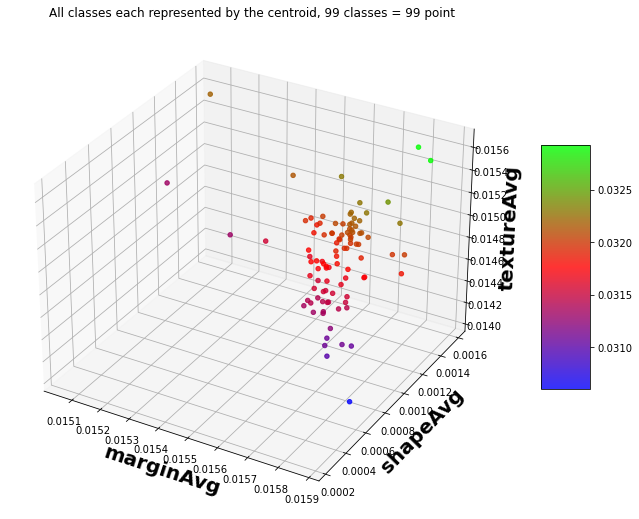

In [219]:
#refrence:https://www.geeksforgeeks.org/3d-scatter-plotting-in-python-using-matplotlib/
# Creating figure
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

fig = plt.figure(figsize = (16, 9))
ax = plt.axes(projection ="3d")

# Add x, y gridlines
ax.grid(b = True, color ='grey',
        
        linestyle ='-.', linewidth = 0.3,
        alpha = 0.2)
#x is the marginAvg feature, y shapeAvg, z textureAvg
x=species_threes_np_mean[:,0]
y=species_threes_np_mean[:,1]
z=species_threes_np_mean[:,2]

# Creating color map
my_cmap = plt.get_cmap('brg')

# Creating plot
sctt = ax.scatter3D(x, y, z,
                    alpha = 0.8,
                    c = (x + y + z),
                    cmap = my_cmap)

plt.title("All classes each represented by the centroid, 99 classes = 99 point")
ax.set_xlabel('marginAvg', fontweight ='bold',fontsize=20)
ax.set_ylabel('shapeAvg', fontweight ='bold',fontsize=20)
ax.set_zlabel('textureAvg', fontweight ='bold',fontsize=20)
fig.colorbar(sctt, ax = ax, shrink = 0.5, aspect = 5)

# show plot
plt.show()


## Break it Apart:
break the problem apart and look at the pieces for more understanding .

plotting 3 classes against each other for a total of 33 plot

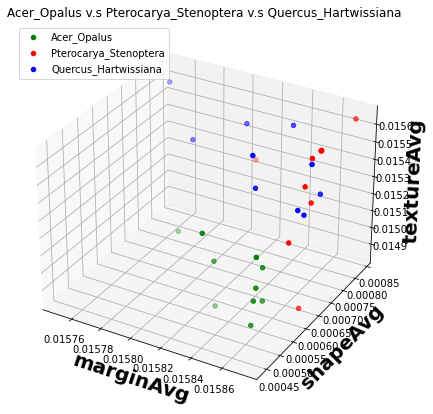

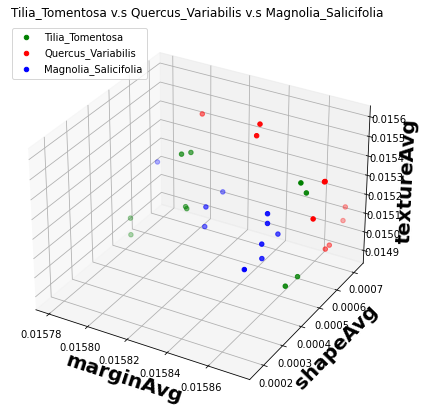

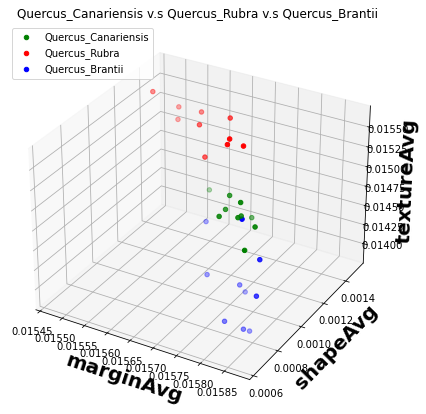

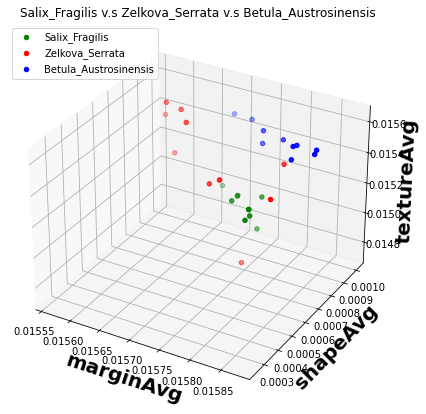

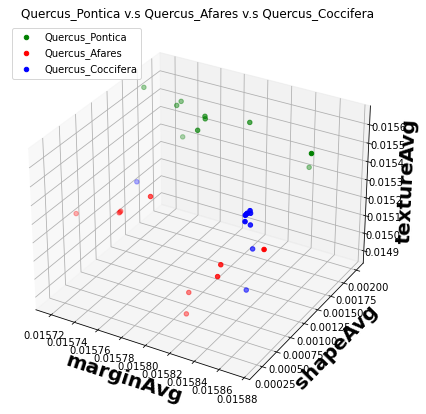

...

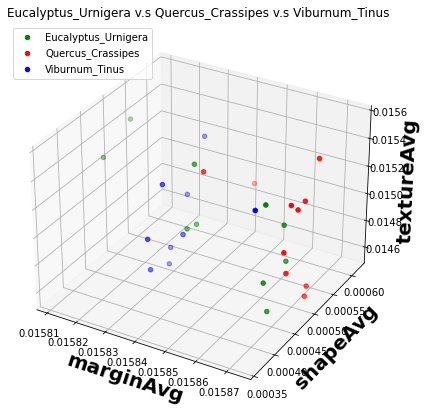

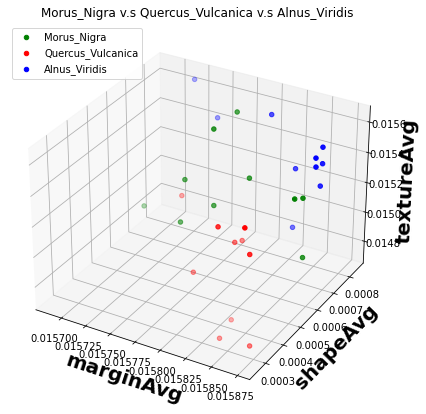

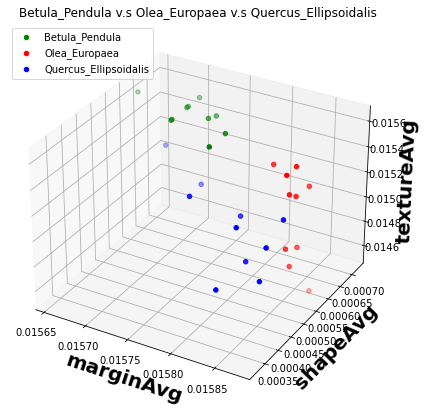

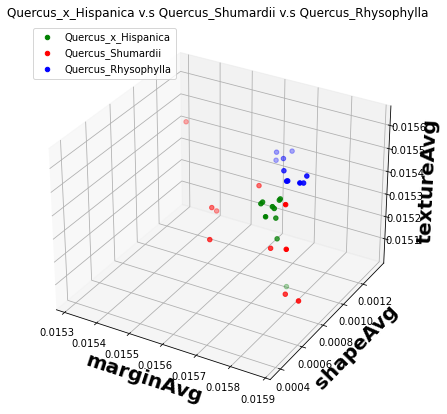

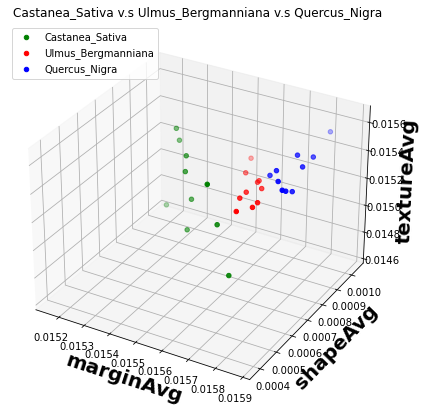

In [220]:
for x in range(0,96,3):
    #getting the data of three classes from the previously created 3 feature dataset
    info_arr = species_threes_np[x:x+3]
    #getting the name of the three classes
    spec_name = df.species.unique()[x:x+3]

    fig = plt.figure(figsize = (10, 7))
    ax = plt.axes(projection ="3d")
    #plotting first class from the three as green dots
    ax.scatter3D(info_arr[0][:,0], info_arr[0][:,1],
                 info_arr[0][:,2], color = "green",label=str(spec_name[0]))
    #plotting second class from the three as red dots
    ax.scatter3D(info_arr[1][:,0], info_arr[1][:,1],
                 info_arr[1][:,2], color = "red",label=str(spec_name[1]))
    #plotting third class from the three as blue dots
    ax.scatter3D(info_arr[2][:,0], info_arr[2][:,1],
                 info_arr[2][:,2], color = "blue",label=str(spec_name[2]))

    plt.legend(loc="upper left")
    plt.title(str(spec_name[0])+" v.s "+str(spec_name[1])+" v.s "+str(spec_name[2]))
    ax.set_xlabel('marginAvg', fontweight ='bold',fontsize=20)
    ax.set_ylabel('shapeAvg', fontweight ='bold',fontsize=20)
    ax.set_zlabel('textureAvg', fontweight ='bold',fontsize=20)

    # show plot
    plt.show()

In [7]:
data = pd.read_csv("train.csv", index_col=0)
pd.set_option("display.max_columns", None)
y = data['species']
data = data.drop(['species'], axis=1)

In [24]:
data

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,0.033203,0.013672,0.019531,0.066406,0.000000,0.029297,0.000000,0.031250,0.011719,0.000000,0.025391,0.023438,0.001953,0.000000,0.015625,0.000000,0.031250,0.000000,0.013672,0.029297,0.015625,0.011719,0.003906,0.025391,0.000000,0.001953,0.011719,0.009766,0.041016,0.037109,0.019531,0.000000,0.009766,0.021484,0.015625,0.007812,0.013672,0.027344,0.062500,0.000000,0.017578,0.031250,0.000000,0.044922,0.007812,0.025391,0.003906,0.013672,0.015625,0.013672,0.003906,0.005859,0.003906,0.019531,0.001953,0.000647,0.000609,0.000576,0.000553,0.000516,0.000496,0.000474,0.000453,0.000454,0.000429,0.000418,0.000410,0.000406,0.000398,0.000399,0.000389,0.000399,0.000416,0.000414,0.000430,0.000422,0.000437,0.000452,0.000467,0.000470,0.000484,0.000489,0.000490,0.000475,0.000486,0.000484,0.000500,0.000513,0.000511,0.000519,0.000513,0.000502,0.000498,0.000487,0.000471,0.000458,0.000440,0.000436,0.000427,0.000394,0.000385,0.000382,0.000370,0.000367,0.000373,0.000386,0.000389,0.000391,0.000414,0.000422,0.000434,0.000452,0.000471,0.000485,0.000512,0.000536,0.000553,0.000610,0.000660,0.049805,0.017578,0.003906,0.024414,0.001953,0.010742,0.035156,0.007812,0.039062,0.062500,0.000000,0.000000,0.007812,0.007812,0.000000,0.000000,0.047852,0.000000,0.054688,0.022461,0.000000,0.000977,0.018555,0.001953,0.008789,0.015625,0.044922,0.000000,0.037109,0.012695,0.028320,0.000000,0.019531,0.026367,0.005859,0.000000,0.004883,0.016602,0.034180,0.056641,0.006836,0.000977,0.022461,0.037109,0.004883,0.021484,0.035156,0.000977,0.004883,0.015625,0.000000,0.000000,0.006836,0.037109,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
2,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,0.007812,0.003906,0.027344,0.023438,0.000000,0.033203,0.000000,0.009766,0.009766,0.007812,0.007812,0.019531,0.007812,0.000000,0.000000,0.007812,0.027344,0.003906,0.037109,0.007812,0.048828,0.054688,0.027344,0.003906,0.000000,0.000000,0.003906,0.013672,0.033203,0.033203,0.019531,0.031250,0.009766,0.0

## 2. Label Encoding: <a class="anchor" id="encode"></a>
label encode the classes. 

Hint: the LabelEncoder has a function `inversetransform()`

In [8]:
encoder=LabelEncoder()
le=encoder.fit(y)
labels=le.transform(y)
classes=list(le.classes_)
y_cat = to_categorical(labels)
# classes

In [9]:
x_train,x_test,y_train,y_test=train_test_split(data,y_cat,test_size=.2,shuffle=True)

In [10]:
x_train_scaled = (x_train - x_train.mean())/x_train.std()
x_test_scaled = (x_test - x_test.mean())/x_test.std()

In [11]:
x_train2,x_val,y_train2,y_val=train_test_split(x_train_scaled,y_train,test_size=.2,shuffle=True)

In [12]:
%reload_ext tensorboard

# Optimizers <a class="anchor" id="opt"></a>
In this ection we will use three different optimizers wnd compare the performance

# (1)Rmsprop

In [155]:
Model_rmsprop = Sequential()
Model_rmsprop.add(Dense(900,input_dim=192, activation='tanh'))
Model_rmsprop.add(Dropout(0.25))
Model_rmsprop.add(Dense(99, activation='softmax'))
import datetime
log_rmsprop = "D:/Queens/fit/" + 'Rmsprop_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [156]:
Model_rmsprop.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_rmsprop = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_rmsprop = TensorBoard(log_dir=log_rmsprop, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_rmsprop = Model_rmsprop.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val),callbacks=[early_stopping_rmsprop, tboard_rmsprop])

Epoch 1/500
4/4 [==============================] - 1s 247ms/step - loss: 3.6341 - accuracy: 0.2354 - val_loss: 2.0700 - val_accuracy: 0.5535
Epoch 2/500
4/4 [==============================] - 0s 112ms/step - loss: 1.4689 - accuracy: 0.7883 - val_loss: 1.2731 - val_accuracy: 0.8050
Epoch 3/500
4/4 [==============================] - 0s 100ms/step - loss: 0.8316 - accuracy: 0.9084 - val_loss: 0.8462 - val_accuracy: 0.8868
Epoch 4/500
4/4 [==============================] - 0s 109ms/step - loss: 0.5235 - accuracy: 0.9652 - val_loss: 0.6368 - val_accuracy: 0.9182
Epoch 5/500
4/4 [==============================] - 0s 140ms/step - loss: 0.3613 - accuracy: 0.9795 - val_loss: 0.5039 - val_accuracy: 0.9434
Epoch 6/500
4/4 [==============================] - 1s 176ms/step - loss: 0.2599 - accuracy: 0.9889 - val_loss: 0.3903 - val_accuracy: 0.9560
Epoch 7/500
4/4 [==============================] - 0s 100ms/step - loss: 0.1892 - accuracy: 0.9968 - val_loss: 0.3450 - val_accuracy: 0.9686
Epoch 8/500
4

In [187]:
%tensorboard --logdir={log_rmsprop} --port 6035

# (2) Adam

In [157]:
Model_adam = Sequential()
Model_adam.add(Dense(900,input_dim=192, activation='tanh'))
Model_adam.add(Dropout(0.25))
Model_adam.add(Dense(99, activation='softmax'))

log_folder_adam = "D:/DEBI/fit/" + 'Adam_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [158]:
Model_adam.compile(loss='categorical_crossentropy',optimizer='adam', metrics = ["accuracy"])
early_stopping_adam = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_adam = TensorBoard(log_dir=log_folder_adam, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_adam = Model_adam.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val),callbacks=[tboard_adam,early_stopping_adam ])

Epoch 1/500
4/4 [==============================] - 1s 250ms/step - loss: 4.3718 - accuracy: 0.0727 - val_loss: 3.1544 - val_accuracy: 0.3899
Epoch 2/500
4/4 [==============================] - 0s 109ms/step - loss: 2.5379 - accuracy: 0.5893 - val_loss: 2.1267 - val_accuracy: 0.6541
Epoch 3/500
4/4 [==============================] - 0s 100ms/step - loss: 1.5018 - accuracy: 0.8246 - val_loss: 1.4622 - val_accuracy: 0.7799
Epoch 4/500
4/4 [==============================] - 0s 100ms/step - loss: 0.8954 - accuracy: 0.9321 - val_loss: 0.9928 - val_accuracy: 0.8679
Epoch 5/500
4/4 [==============================] - 0s 113ms/step - loss: 0.5445 - accuracy: 0.9573 - val_loss: 0.7044 - val_accuracy: 0.9057
Epoch 6/500
4/4 [==============================] - 0s 98ms/step - loss: 0.3494 - accuracy: 0.9731 - val_loss: 0.5169 - val_accuracy: 0.9497
Epoch 7/500
4/4 [==============================] - 0s 117ms/step - loss: 0.2400 - accuracy: 0.9842 - val_loss: 0.4056 - val_accuracy: 0.9497
Epoch 8/500
4/

In [188]:
%tensorboard --logdir={log_folder_adam} --port 6036

In [21]:
evaluation(Model_adam,x_train_scaled, y_train, x_test_scaled, y_test)

Train loss =  0.016729164868593216
Train Accuracy =  0.993686854839325
Test loss =  0.10351846367120743
Test Accuracy =  0.9646464586257935


# (3)SGD

In [159]:
Model_Sgd = Sequential()
Model_Sgd.add(Dense(900,input_dim=192, activation='tanh'))
Model_Sgd.add(Dropout(0.25))
Model_Sgd.add(Dense(99, activation='softmax'))

log_folder_sgd = "D:/DEBI/fit/" + 'SGD_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [160]:
osgd = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=False, name="SGD")

In [161]:
Model_Sgd.compile(loss='categorical_crossentropy',optimizer=osgd, metrics = ["accuracy"])
early_stopping_sgd = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_sgd = TensorBoard(log_dir=log_folder_sgd, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_sgd = Model_Sgd.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val), callbacks=[tboard_sgd,early_stopping_sgd ])

Epoch 1/500
4/4 [==============================] - 1s 236ms/step - loss: 4.7383 - accuracy: 0.0095 - val_loss: 4.4434 - val_accuracy: 0.0189
Epoch 2/500
4/4 [==============================] - 0s 110ms/step - loss: 4.3196 - accuracy: 0.0569 - val_loss: 3.9704 - val_accuracy: 0.1447
Epoch 3/500
4/4 [==============================] - 0s 103ms/step - loss: 3.6863 - accuracy: 0.1975 - val_loss: 3.4176 - val_accuracy: 0.2767
Epoch 4/500
4/4 [==============================] - 0s 112ms/step - loss: 3.0035 - accuracy: 0.4076 - val_loss: 2.8887 - val_accuracy: 0.4214
Epoch 5/500
4/4 [==============================] - 0s 100ms/step - loss: 2.3998 - accuracy: 0.5829 - val_loss: 2.4276 - val_accuracy: 0.5535
Epoch 6/500
4/4 [==============================] - 0s 117ms/step - loss: 1.8433 - accuracy: 0.7425 - val_loss: 2.0462 - val_accuracy: 0.6352
Epoch 7/500
4/4 [==============================] - 0s 123ms/step - loss: 1.4821 - accuracy: 0.8231 - val_loss: 1.7257 - val_accuracy: 0.7107
Epoch 8/500
4

In [189]:
%tensorboard --logdir={log_folder_sgd} --port 6037

In [22]:
evaluation(Model_Sgd,x_train_scaled, y_train, x_test_scaled, y_test)

Train loss =  0.02154579944908619
Train Accuracy =  0.9962121248245239
Test loss =  0.11347535997629166
Test Accuracy =  0.9646464586257935


# Batch Size <a class="anchor" id="batch"></a>

# (1) Batch Size = 100

In [162]:
Model_batch_100 = Sequential()
Model_batch_100.add(Dense(900,input_dim=192, activation='tanh'))
Model_batch_100.add(Dropout(0.25))
Model_batch_100.add(Dense(99, activation='softmax'))

log_folder_batch_100 = "D:/DEBI/fit/" + 'Batch_100_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [163]:
Model_batch_100.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_batch_100 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_batch_100 = TensorBoard(log_dir=log_folder_batch_100, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_tboard_batch_100 = Model_batch_100.fit(x_train2, y_train2,batch_size=100,epochs=500 ,verbose=1,validation_data=(x_val, y_val),callbacks=[early_stopping_batch_100,tboard_batch_100])

Epoch 1/500
7/7 [==============================] - 1s 123ms/step - loss: 3.1476 - accuracy: 0.3681 - val_loss: 1.7610 - val_accuracy: 0.6792
Epoch 2/500
7/7 [==============================] - 0s 62ms/step - loss: 1.1219 - accuracy: 0.8641 - val_loss: 1.0371 - val_accuracy: 0.8176
Epoch 3/500
7/7 [==============================] - 0s 67ms/step - loss: 0.5537 - accuracy: 0.9542 - val_loss: 0.6629 - val_accuracy: 0.8994
Epoch 4/500
7/7 [==============================] - 1s 96ms/step - loss: 0.3343 - accuracy: 0.9889 - val_loss: 0.4714 - val_accuracy: 0.9245
Epoch 5/500
7/7 [==============================] - 0s 51ms/step - loss: 0.2017 - accuracy: 0.9921 - val_loss: 0.3539 - val_accuracy: 0.9623
Epoch 6/500
7/7 [==============================] - 0s 53ms/step - loss: 0.1349 - accuracy: 0.9968 - val_loss: 0.2939 - val_accuracy: 0.9560
Epoch 7/500
7/7 [==============================] - 0s 70ms/step - loss: 0.0965 - accuracy: 0.9984 - val_loss: 0.2626 - val_accuracy: 0.9560
Epoch 8/500
7/7 [==

In [192]:
%tensorboard --logdir={log_folder_batch_100} --port 6038

# (2) Batch Size = 150

In [164]:
Model_batch_150 = Sequential()
Model_batch_150.add(Dense(900,input_dim=192, activation='tanh'))
Model_batch_150.add(Dropout(0.25))
Model_batch_150.add(Dense(99, activation='softmax'))

log_folder_batch_150 = "D:/DEBI/fit/" + 'Batch_150_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [165]:
Model_batch_150.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_batch_150 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_batch_150 = TensorBoard(log_dir=log_folder_batch_150, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_tboard_batch_150 = Model_batch_150.fit(x_train2, y_train2,batch_size=150,epochs=500 ,verbose=1,validation_data=(x_val, y_val),callbacks=[early_stopping_batch_150,tboard_batch_150])

Epoch 1/500
5/5 [==============================] - 1s 198ms/step - loss: 3.4067 - accuracy: 0.2859 - val_loss: 1.9032 - val_accuracy: 0.6604
Epoch 2/500
5/5 [==============================] - 0s 75ms/step - loss: 1.3016 - accuracy: 0.8483 - val_loss: 1.1839 - val_accuracy: 0.8239
Epoch 3/500
5/5 [==============================] - 0s 78ms/step - loss: 0.7176 - accuracy: 0.9336 - val_loss: 0.7737 - val_accuracy: 0.8742
Epoch 4/500
5/5 [==============================] - 0s 87ms/step - loss: 0.4520 - accuracy: 0.9668 - val_loss: 0.5639 - val_accuracy: 0.9182
Epoch 5/500
5/5 [==============================] - 0s 77ms/step - loss: 0.3021 - accuracy: 0.9921 - val_loss: 0.4366 - val_accuracy: 0.9560
Epoch 6/500
5/5 [==============================] - 0s 73ms/step - loss: 0.2089 - accuracy: 0.9953 - val_loss: 0.3724 - val_accuracy: 0.9686
Epoch 7/500
5/5 [==============================] - 0s 85ms/step - loss: 0.1572 - accuracy: 0.9968 - val_loss: 0.3144 - val_accuracy: 0.9623
Epoch 8/500
5/5 [==

In [193]:
%tensorboard --logdir={log_folder_batch_150} --port 6039

# (3) Batch Size = 50

In [166]:
Model_batch_50 = Sequential()
Model_batch_50.add(Dense(900,input_dim=192, activation='tanh'))
Model_batch_50.add(Dropout(0.25))
Model_batch_50.add(Dense(99, activation='softmax'))

log_folder_batch_50 = "D:/DEBI/fit/" + 'Batch_50_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [167]:
Model_batch_50.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_batch_50 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_batch_50 = TensorBoard(log_dir=log_folder_batch_50, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_tboard_batch_50 = Model_batch_50.fit(x_train2, y_train2,batch_size=50,epochs=500 ,verbose=1,validation_data=(x_val, y_val),callbacks=[early_stopping_batch_50,tboard_batch_50])

Epoch 1/500
13/13 [==============================] - 1s 72ms/step - loss: 2.7653 - accuracy: 0.4344 - val_loss: 1.4451 - val_accuracy: 0.7925
Epoch 2/500
13/13 [==============================] - 0s 28ms/step - loss: 0.8219 - accuracy: 0.9147 - val_loss: 0.7514 - val_accuracy: 0.8994
Epoch 3/500
13/13 [==============================] - 0s 30ms/step - loss: 0.3690 - accuracy: 0.9763 - val_loss: 0.4315 - val_accuracy: 0.9434
Epoch 4/500
13/13 [==============================] - 0s 28ms/step - loss: 0.1886 - accuracy: 0.9874 - val_loss: 0.2938 - val_accuracy: 0.9497
Epoch 5/500
13/13 [==============================] - 0s 31ms/step - loss: 0.1071 - accuracy: 0.9953 - val_loss: 0.2022 - val_accuracy: 0.9748
Epoch 6/500
13/13 [==============================] - 0s 33ms/step - loss: 0.0640 - accuracy: 0.9984 - val_loss: 0.1641 - val_accuracy: 0.9748
Epoch 7/500
13/13 [==============================] - 0s 34ms/step - loss: 0.0386 - accuracy: 1.0000 - val_loss: 0.1628 - val_accuracy: 0.9748
Epoch 

In [194]:
%tensorboard --logdir={log_folder_batch_50} --port 6040

# Dropout Rate <a class="anchor" id="dropout"></a>


# (1) Dropout Rate = .01

In [168]:
Model_dropout_1 = Sequential()
Model_dropout_1.add(Dense(900,input_dim=192, activation='tanh'))
Model_dropout_1.add(Dropout(0.1))
Model_dropout_1.add(Dense(99, activation='softmax'))

log_folder_dropout_1 = "D:/DEBI/fit/" + 'Dropout_1_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [169]:
Model_dropout_1.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_dropout_1 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_dropout_1 = TensorBoard(log_dir=log_folder_dropout_1, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_dropout_1 = Model_dropout_1.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val), callbacks=[early_stopping_dropout_1, tboard_dropout_1])

Epoch 1/500
4/4 [==============================] - 1s 286ms/step - loss: 3.5844 - accuracy: 0.2543 - val_loss: 2.0279 - val_accuracy: 0.5723
Epoch 2/500
4/4 [==============================] - 0s 118ms/step - loss: 1.3649 - accuracy: 0.8104 - val_loss: 1.1946 - val_accuracy: 0.7862
Epoch 3/500
4/4 [==============================] - 0s 104ms/step - loss: 0.7441 - accuracy: 0.9336 - val_loss: 0.8065 - val_accuracy: 0.8805
Epoch 4/500
4/4 [==============================] - 0s 116ms/step - loss: 0.4603 - accuracy: 0.9731 - val_loss: 0.6176 - val_accuracy: 0.9182
Epoch 5/500
4/4 [==============================] - 0s 124ms/step - loss: 0.3139 - accuracy: 0.9858 - val_loss: 0.4700 - val_accuracy: 0.9497
Epoch 6/500
4/4 [==============================] - 0s 105ms/step - loss: 0.2112 - accuracy: 0.9937 - val_loss: 0.3871 - val_accuracy: 0.9560
Epoch 7/500
4/4 [==============================] - 0s 97ms/step - loss: 0.1559 - accuracy: 1.0000 - val_loss: 0.3399 - val_accuracy: 0.9623
Epoch 8/500
4/

In [195]:
%tensorboard --logdir={log_folder_dropout_1} --port 6041

# (2) Dropout Rate = .5

In [170]:
Model_dropout_2 = Sequential()
Model_dropout_2.add(Dense(900,input_dim=192, activation='tanh'))
Model_dropout_2.add(Dropout(0.50))
Model_dropout_2.add(Dense(99, activation='softmax'))

log_folder_dropout_2 = "D:/DEBI/fit/" + 'Dropout_2_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [171]:
Model_dropout_2.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_dropout_2 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_dropout_2 = TensorBoard(log_dir=log_folder_dropout_2, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_dropout_2 = Model_dropout_2.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val), callbacks=[early_stopping_dropout_2, tboard_dropout_2])

Epoch 1/500
4/4 [==============================] - 1s 238ms/step - loss: 3.9550 - accuracy: 0.1469 - val_loss: 2.4312 - val_accuracy: 0.5660
Epoch 2/500
4/4 [==============================] - 0s 101ms/step - loss: 1.8380 - accuracy: 0.6983 - val_loss: 1.6130 - val_accuracy: 0.7358
Epoch 3/500
4/4 [==============================] - 0s 126ms/step - loss: 1.1153 - accuracy: 0.8689 - val_loss: 1.1176 - val_accuracy: 0.8491
Epoch 4/500
4/4 [==============================] - 0s 104ms/step - loss: 0.7525 - accuracy: 0.9258 - val_loss: 0.8521 - val_accuracy: 0.8805
Epoch 5/500
4/4 [==============================] - 0s 109ms/step - loss: 0.5739 - accuracy: 0.9431 - val_loss: 0.6716 - val_accuracy: 0.9245
Epoch 6/500
4/4 [==============================] - 0s 106ms/step - loss: 0.4348 - accuracy: 0.9668 - val_loss: 0.5240 - val_accuracy: 0.9497
Epoch 7/500
4/4 [==============================] - 0s 103ms/step - loss: 0.3100 - accuracy: 0.9905 - val_loss: 0.4569 - val_accuracy: 0.9434
Epoch 8/500
4

In [196]:
%tensorboard --logdir={log_folder_dropout_2} --port 6042

# Hidden Size <a class="anchor" id="hidden"></a>

# (1) Hidden Layer Size = 600

In [172]:
Model_hidden_1 = Sequential()
Model_hidden_1.add(Dense(600,input_dim=192, activation='tanh'))
Model_hidden_1.add(Dropout(0.50))
Model_hidden_1.add(Dense(99, activation='softmax'))

log_folder_hidden_1 = "D:/DEBI/fit/" + 'Hidden_1_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [173]:
Model_hidden_1.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_hidden_1 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_hidden_1 = TensorBoard(log_dir=log_folder_hidden_1, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_hidden_1 = Model_hidden_1.fit(x_train2, y_train2,batch_size=192,epochs=500 ,verbose=1,validation_data=(x_val, y_val), callbacks=[early_stopping_hidden_1, tboard_hidden_1])

Epoch 1/500
4/4 [==============================] - 1s 282ms/step - loss: 4.1086 - accuracy: 0.1295 - val_loss: 2.7926 - val_accuracy: 0.4591
Epoch 2/500
4/4 [==============================] - 0s 95ms/step - loss: 2.3614 - accuracy: 0.5482 - val_loss: 1.9771 - val_accuracy: 0.7358
Epoch 3/500
4/4 [==============================] - 0s 90ms/step - loss: 1.6296 - accuracy: 0.7330 - val_loss: 1.5292 - val_accuracy: 0.7925
Epoch 4/500
4/4 [==============================] - 0s 117ms/step - loss: 1.1696 - accuracy: 0.8515 - val_loss: 1.2135 - val_accuracy: 0.8616
Epoch 5/500
4/4 [==============================] - 0s 97ms/step - loss: 0.9091 - accuracy: 0.8942 - val_loss: 0.9815 - val_accuracy: 0.8994
Epoch 6/500
4/4 [==============================] - 0s 94ms/step - loss: 0.6805 - accuracy: 0.9494 - val_loss: 0.8073 - val_accuracy: 0.9119
Epoch 7/500
4/4 [==============================] - 0s 88ms/step - loss: 0.5552 - accuracy: 0.9558 - val_loss: 0.6916 - val_accuracy: 0.9245
Epoch 8/500
4/4 [=

In [197]:
%tensorboard --logdir={log_folder_hidden_1} --port 6043

# (2) Hidden Layer Size = 300

In [174]:
Model_hidden_2 = Sequential()
Model_hidden_2.add(Dense(300,input_dim=192, activation='tanh'))
Model_hidden_2.add(Dropout(0.50))
Model_hidden_2.add(Dense(99, activation='softmax'))

log_folder_hidden_2 = "D:/DEBI/fit/" + 'Hidden_2_' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

In [175]:
Model_hidden_2.compile(loss='categorical_crossentropy',optimizer='rmsprop', metrics = ["accuracy"])
early_stopping_hidden_2 = EarlyStopping(monitor='val_accuracy', patience=50)
tboard_hidden_2 = TensorBoard(log_dir=log_folder_hidden_2, histogram_freq=1, write_graph=True, write_images=True,
                      update_freq='epoch', profile_batch=2,embeddings_freq=1)
history_log_hidden_2 = Model_hidden_2.fit(x_train2, y_train2,batch_size=128,epochs=500 ,verbose=1,validation_data=(x_val, y_val), callbacks=[early_stopping_hidden_2, tboard_hidden_2])

Epoch 1/500
5/5 [==============================] - 1s 164ms/step - loss: 4.3614 - accuracy: 0.0664 - val_loss: 3.3505 - val_accuracy: 0.3082
Epoch 2/500
5/5 [==============================] - 0s 70ms/step - loss: 3.1469 - accuracy: 0.2875 - val_loss: 2.6942 - val_accuracy: 0.5409
Epoch 3/500
5/5 [==============================] - 0s 67ms/step - loss: 2.4428 - accuracy: 0.4992 - val_loss: 2.2300 - val_accuracy: 0.6918
Epoch 4/500
5/5 [==============================] - 0s 72ms/step - loss: 1.9762 - accuracy: 0.6524 - val_loss: 1.8931 - val_accuracy: 0.7673
Epoch 5/500
5/5 [==============================] - 0s 60ms/step - loss: 1.6161 - accuracy: 0.7314 - val_loss: 1.6252 - val_accuracy: 0.8113
Epoch 6/500
5/5 [==============================] - 0s 73ms/step - loss: 1.2928 - accuracy: 0.8310 - val_loss: 1.3945 - val_accuracy: 0.8679
Epoch 7/500
5/5 [==============================] - 0s 66ms/step - loss: 1.0566 - accuracy: 0.8752 - val_loss: 1.1990 - val_accuracy: 0.9057
Epoch 8/500
5/5 [==

In [198]:
%tensorboard --logdir={log_folder_hidden_2} --port 6044

# Results:<a class="anchor" id="result"></a>
Evaluating Every Model Using Our Function 

In [199]:
print("Rmsprop Model")
evaluation(Model_rmsprop,x_train_scaled, y_train, x_test_scaled, y_test)

Rmsprop Model
Train loss =  0.013180740177631378
Train Accuracy =  0.997474730014801
Test loss =  0.18574537336826324
Test Accuracy =  0.9545454382896423


In [200]:
print("Adam Model")
evaluation(Model_adam,x_train_scaled, y_train, x_test_scaled, y_test)

Adam Model
Train loss =  0.021247614175081253
Train Accuracy =  0.9962121248245239
Test loss =  0.21255998313426971
Test Accuracy =  0.9343434572219849


In [201]:
print("SGD Model")
evaluation(Model_Sgd,x_train_scaled, y_train, x_test_scaled, y_test)

SGD Model
Train loss =  0.04251981899142265
Train Accuracy =  0.9949495196342468
Test loss =  0.24937105178833008
Test Accuracy =  0.9343434572219849


In [202]:
print("Batch Size 100 Model")
evaluation(Model_batch_100,x_train_scaled, y_train, x_test_scaled, y_test)

Batch Size 100 Model
Train loss =  0.01838119886815548
Train Accuracy =  0.997474730014801
Test loss =  0.20229661464691162
Test Accuracy =  0.9545454382896423


In [203]:
print("Batch Size 150 Model")
evaluation(Model_batch_150,x_train_scaled, y_train, x_test_scaled, y_test)

Batch Size 150 Model
Train loss =  0.013150641694664955
Train Accuracy =  0.9987373948097229
Test loss =  0.18796047568321228
Test Accuracy =  0.9595959782600403


In [204]:
print("Batch Size 50 Model")
evaluation(Model_batch_50,x_train_scaled, y_train, x_test_scaled, y_test)

Batch Size 50 Model
Train loss =  0.014162043109536171
Train Accuracy =  0.997474730014801
Test loss =  0.17761625349521637
Test Accuracy =  0.9595959782600403


In [205]:
print("Dropout Rate .1 Model")
evaluation(Model_dropout_1,x_train_scaled, y_train, x_test_scaled, y_test)

Dropout Rate .1 Model
Train loss =  0.015802163630723953
Train Accuracy =  0.997474730014801
Test loss =  0.1609795093536377
Test Accuracy =  0.9545454382896423


In [206]:
print("Dropout Rate .5 Model")
evaluation(Model_dropout_2,x_train_scaled, y_train, x_test_scaled, y_test)

Dropout Rate .5 Model
Train loss =  0.010015273466706276
Train Accuracy =  0.9987373948097229
Test loss =  0.1612686663866043
Test Accuracy =  0.9545454382896423


In [207]:
print("Hidden Layer Size 600 Model")
evaluation(Model_hidden_1,x_train_scaled, y_train, x_test_scaled, y_test)

Hidden Layer Size 600 Model
Train loss =  0.01065282616764307
Train Accuracy =  0.9987373948097229
Test loss =  0.1444544494152069
Test Accuracy =  0.9646464586257935


In [208]:
print("Hidden Layer Size 300 Model")
evaluation(Model_hidden_2,x_train_scaled, y_train, x_test_scaled, y_test)

Hidden Layer Size 300 Model
Train loss =  0.012873398140072823
Train Accuracy =  0.9987373948097229
Test loss =  0.17933282256126404
Test Accuracy =  0.9595959782600403


In [127]:
Model_hidden_2.evaluate(x_test_scaled, y_test, verbose=0)

[0.17548690736293793, 0.9595959782600403]

In [97]:
Model_hidden_1.evaluate(x_test_scaled, y_test, verbose=0)

[0.15391165018081665, 0.9595959782600403]

In [186]:
x_test_scaled

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,margin11,margin12,margin13,margin14,margin15,margin16,margin17,margin18,margin19,margin20,margin21,margin22,margin23,margin24,margin25,margin26,margin27,margin28,margin29,margin30,margin31,margin32,margin33,margin34,margin35,margin36,margin37,margin38,margin39,margin40,margin41,margin42,margin43,margin44,margin45,margin46,margin47,margin48,margin49,margin50,margin51,margin52,margin53,margin54,margin55,margin56,margin57,margin58,margin59,margin60,margin61,margin62,margin63,margin64,shape1,shape2,shape3,shape4,shape5,shape6,shape7,shape8,shape9,shape10,shape11,shape12,shape13,shape14,shape15,shape16,shape17,shape18,shape19,shape20,shape21,shape22,shape23,shape24,shape25,shape26,shape27,shape28,shape29,shape30,shape31,shape32,shape33,shape34,shape35,shape36,shape37,shape38,shape39,shape40,shape41,shape42,shape43,shape44,shape45,shape46,shape47,shape48,shape49,shape50,shape51,shape52,shape53,shape54,shape55,shape56,shape57,shape58,shape59,shape60,shape61,shape62,shape63,shape64,texture1,texture2,texture3,texture4,texture5,texture6,texture7,texture8,texture9,texture10,texture11,texture12,texture13,texture14,texture15,texture16,texture17,texture18,texture19,texture20,texture21,texture22,texture23,texture24,texture25,texture26,texture27,texture28,texture29,texture30,texture31,texture32,texture33,texture34,texture35,texture36,texture37,texture38,texture39,texture40,texture41,texture42,texture43,texture44,texture45,texture46,texture47,texture48,texture49,texture50,texture51,texture52,texture53,texture54,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
721,-0.904301,-0.768213,-0.387242,-0.313486,-0.183736,-0.589138,-0.783325,-0.428285,-0.079717,-0.900021,-0.899320,1.674519,-0.575493,0.351525,1.455410,-0.071067,0.798907,-0.671521,0.503225,-0.746481,-0.734489,2.172091,0.972203,2.805442,2.169608,0.166315,1.227062,-0.358321,-0.532356,-0.847202,0.609077,0.875114,-0.741791,-0.540289,-0.978163,-0.141199,-0.164945,-0.127421,1.146531,0.554306,0.050348,-0.993468,1.602925,0.700505,0.373750,0.484572,-0.683420,0.573136,0.649637,-0.279877,-0.308018,-0.386991,0.781570,0.137449,-0.083468,0.415491,-0.478478,-0.713446,0.401877,-0.459809,-0.567629,0.941619,-0.372198,0.586230,-0.853636,-0.879072,-0.776934,-0.472761,-0.467719,-0.367628,-0.127523,0.116940,-0.000287,0.171236,0.150731,0.241867,0.233910,0.402328,0.347795,0.447435,0.323891,0.440095,0.309998,0.337014,0.320001,0.191181,0.234952,0.036303,0.068042,-0.174211,-0.157145,-0.423291,-0.630147,-0.603294,-0.806425,-0.898140,-0.747757,-0.825674,-0.817536,-0.645365,-0.509231,-0.262144,-0.118605,0.082907,0.287532,0.261041,0.303860,0.300423,0.172369,0.322467,0.375113,0.379492,0.391424,0.391356,0.446756,0.289885,0.304663,0.158088,0.124474,0.095774,-0.158581,-0.268382,-0.212261,-0.478507,-0.606361,-0.621989,-0.790655,-1.015079,0.047154,-0.405962,0.234153,-0.596385,-0.202217,-0.436935,0.698766,0.562495,-0.035683,-0.549455,-0.372503,-0.360381,0.247255,0.218995,-0.182607,1.011766,-0.434945,-0.454208,-0.355798,0.183983,-0.178595,1.698870,0.375441,-0.555523,-0.668882,-0.472278,-0.188550,0.006179,0.824954,0.410371,0.501937,-0.246539,-0.394519,0.285664,0.507164,-0.203259,-0.370801,1.476492,0.017813,-0.544275,-0.411262,0.749816,0.262345,-0.217015,0.015418,1.518086,1.184113,-0.498595,0.383897,1.383663,-0.314326,1.369050,-0.677040,0.131218,-0.281547,-0.252487,0.398111,-0.476197,0.391134,-0.218599,-0.217845,-0.345529,1.146539,1.038751
993,-0.257890,-0.339895,-1.239129,-0.627395,0.008244,-0.208172,1.467692,-0.428285,-0.079717,0.443918,-0.546002,-0.351687,-0.618490,1.784326,-0.044059,-0.071067,1.907550,-0.576760,1.059137,0.039724,0.561085,0.954892,-0.280506,2.678974,0.608068,0.166315,1.033327,-0.784943,-